In [2]:
import numpy as np
import pylab as plt
import os
%matplotlib inline
import astropy.time as at

amp
[[1.14230008]
 [0.70103896]]


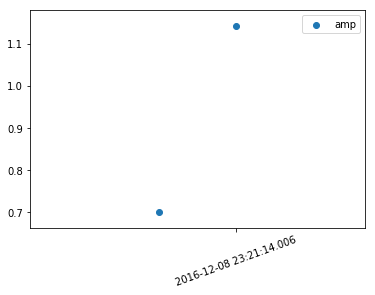

lengthscales
[[28.63149075]
 [31.14639402]]


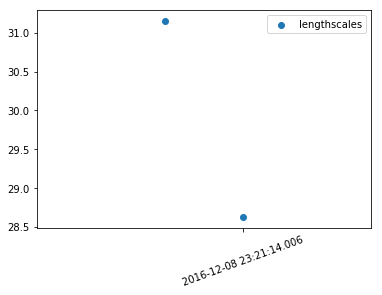

a
[[93.53623051]
 [92.25493006]]


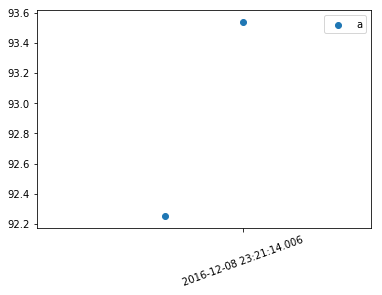

b
[[39.54888857]
 [26.32048131]]


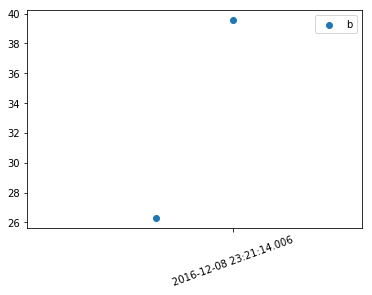

y_sigma
[[0.00321852]
 [0.00115645]]


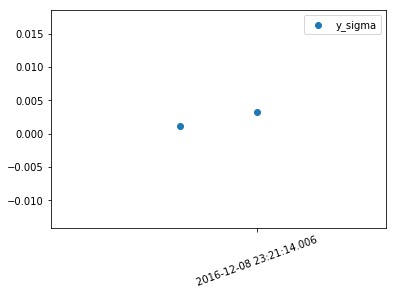

clock_scale
[[0.02       0.02       0.02       ... 0.03106316 0.04536674 0.04743589]
 [0.02       0.02       0.02       ... 0.03106316 0.04536674 0.04743589]]


ValueError: x and y must be the same size

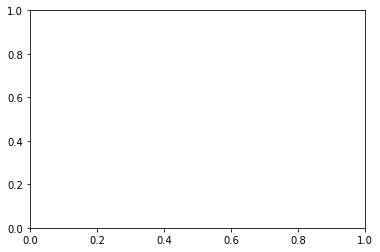

In [6]:
dir ='/home/albert/git/remote_pycharm/bayes_filter/debug/test_filter_vi_P126+65/run18'
d = np.load(os.path.join(dir,'hyperparam_store.npz'))
times = at.Time(d['times']/86400., format='mjd')
keys = ['amp', 'lengthscales', 'a', 'b', 'y_sigma', 'clock_scale']
for k in keys:
    print(k)
    if k not in d.keys():
        continue
    print(d[k])
    plt.scatter(times.mjd, d[k],label=k)
    plt.xticks(times.mjd[::100],times.iso[::100],rotation=20.)
    plt.legend()
    plt.show()


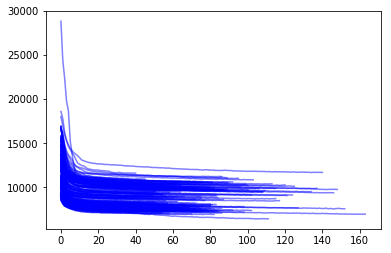

In [4]:
p = np.load(os.path.join(dir, 'performance_store.npz'))
for l in p['loss']:
    l = np.where(np.greater(l, 0.), l, np.nan)
    plt.plot(l,alpha=0.5,c='b')
plt.show()
    

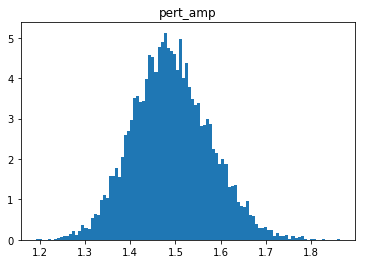

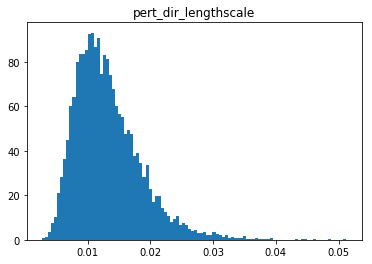

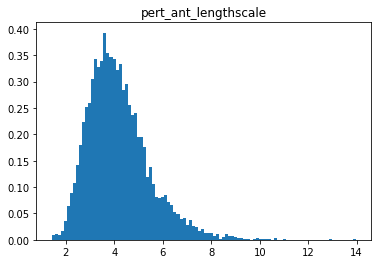

In [5]:
from scipy.special import erfinv

def log_normal_cdf_solve(x1, x2 ,P1=0.1, P2=0.9):
    a = np.sqrt(2.)*erfinv(2. * P1 - 1.)
    b = np.sqrt(2.)*erfinv(2. * P2 - 1.)
    log1 = np.log(x1)
    log2 = np.log(x2)
    mu = (a * log2 - b * log1) / (a - b)
    sigma = (log1 - log2) / (a - b)
    return mu, sigma


mu, sigma = log_normal_cdf_solve(1.3, 1.7 ,P1=0.01, P2=0.99)
Z = np.random.lognormal(mu, sigma,size=10000)
plt.hist(Z,bins=100,density=True)

plt.title('pert_amp')
plt.show()
mu, sigma = log_normal_cdf_solve(0.005, 0.03 ,P1=0.01, P2=0.99)
Z = np.random.lognormal(mu, sigma,size=10000)
plt.hist(Z,bins=100,density=True)

plt.title('pert_dir_lengthscale')
plt.show()
mu, sigma = log_normal_cdf_solve(2., 8. ,P1=0.01, P2=0.99)
Z = np.random.lognormal(mu, sigma,size=10000)
plt.hist(Z,bins=100,density=True)

plt.title('pert_ant_lengthscale')
plt.show()


In [3]:
from bayes_filter.datapack import DataPack
import pylab as plt
import numpy as np

W0702 13:37:46.796600 139820508157760 deprecation_wrapper.py:119] From /net/lofar1/data1/albert/miniconda3/envs/bayes_filter/lib/python3.6/site-packages/bayes_filter-0.0.1-py3.6.egg/bayes_filter/__init__.py:4: The name tf.logging.set_verbosity is deprecated. Please use tf.compat.v1.logging.set_verbosity instead.

W0702 13:37:46.798919 139820508157760 deprecation_wrapper.py:119] From /net/lofar1/data1/albert/miniconda3/envs/bayes_filter/lib/python3.6/site-packages/bayes_filter-0.0.1-py3.6.egg/bayes_filter/__init__.py:4: The name tf.logging.INFO is deprecated. Please use tf.compat.v1.logging.INFO instead.



/net/lofar1/data1/albert/miniconda3/envs/bayes_filter/lib/python3.6/site-packages/tables-3.4.5.dev0-py3.6-linux-x86_64.egg/tables/leaf.py:414: PerformanceWarning: The Leaf ``/sol000/amplitude000/val`` is exceeding the maximum recommended rowsize (104857600 bytes);
be ready to see PyTables asking for *lots* of memory and possibly slow
I/O.  You may want to reduce the rowsize by trimming the value of
dimensions that are orthogonal (and preferably close) to the *main*
dimension of this leave.  Alternatively, in case you have specified a
very small/large chunksize, you may want to increase/decrease it.
  PerformanceWarning)


mean abs residuals: 0.1669586998142119


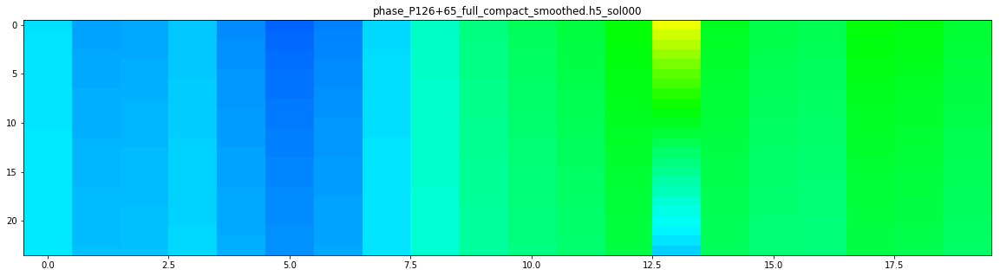

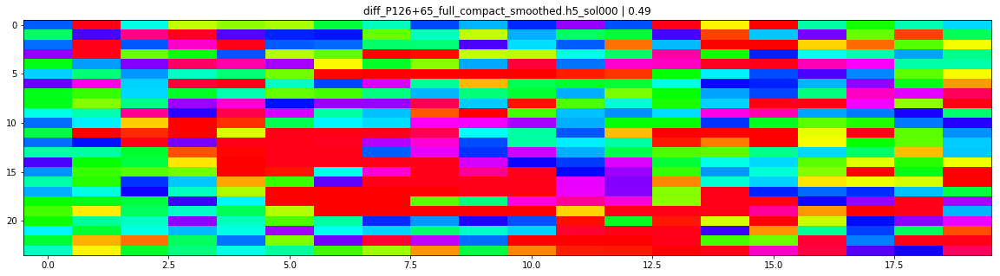

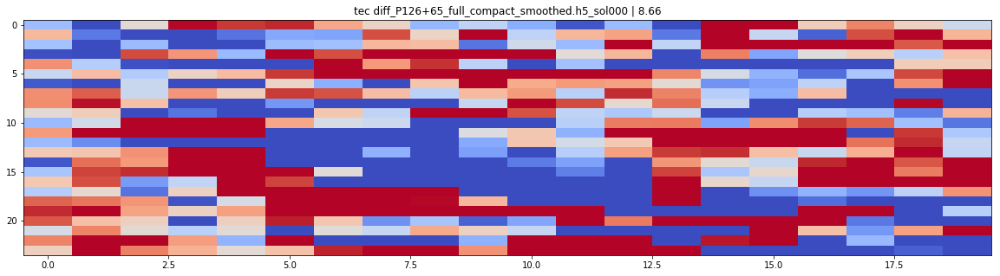

/net/lofar1/data1/albert/miniconda3/envs/bayes_filter/lib/python3.6/site-packages/tables-3.4.5.dev0-py3.6-linux-x86_64.egg/tables/leaf.py:414: PerformanceWarning: The Leaf ``/data_posterior/phase000/val`` is exceeding the maximum recommended rowsize (104857600 bytes);
be ready to see PyTables asking for *lots* of memory and possibly slow
I/O.  You may want to reduce the rowsize by trimming the value of
dimensions that are orthogonal (and preferably close) to the *main*
dimension of this leave.  Alternatively, in case you have specified a
very small/large chunksize, you may want to increase/decrease it.
  PerformanceWarning)


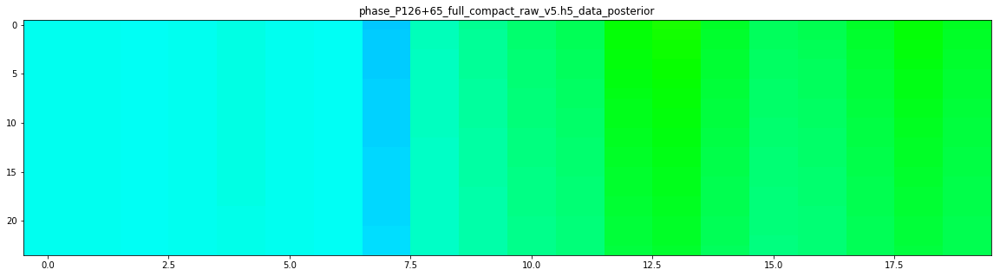

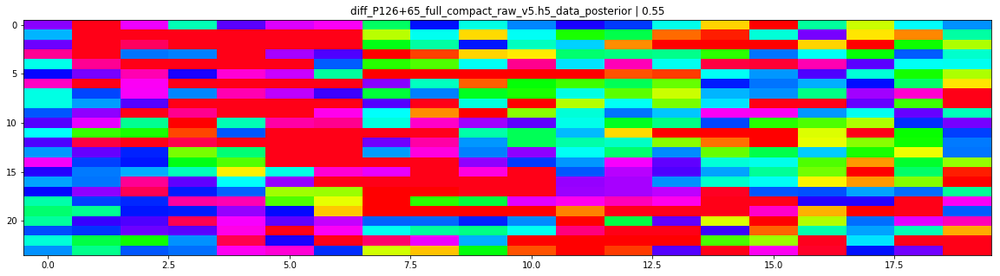

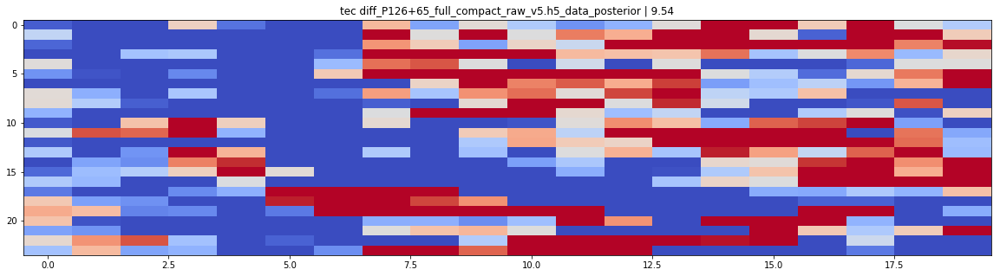

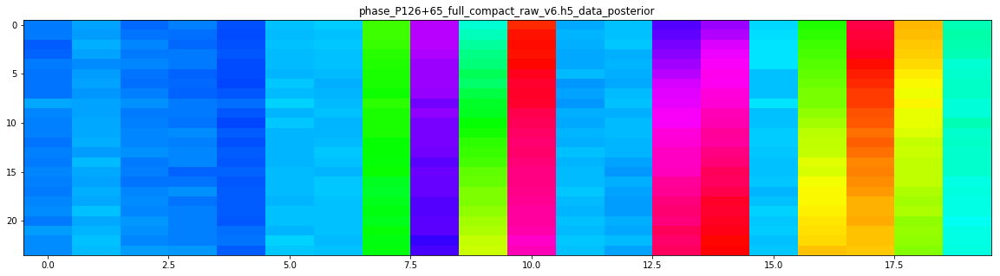

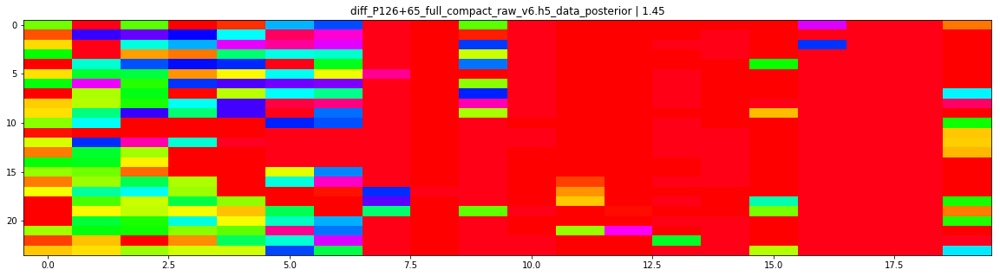

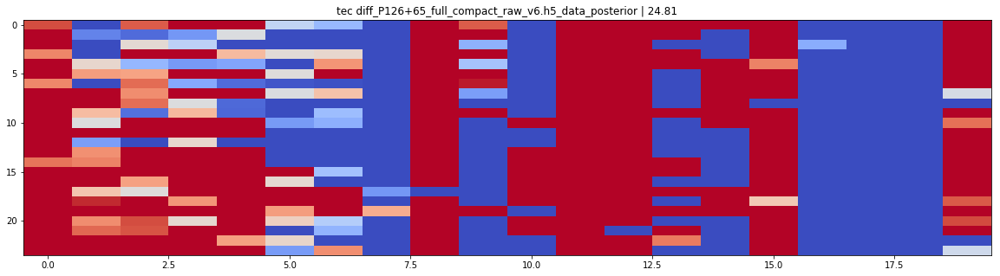

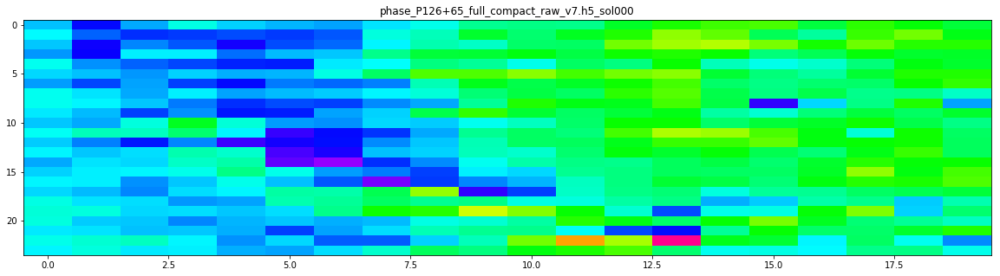

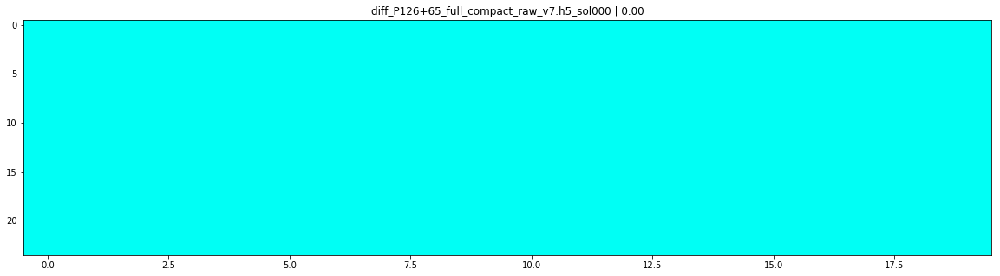

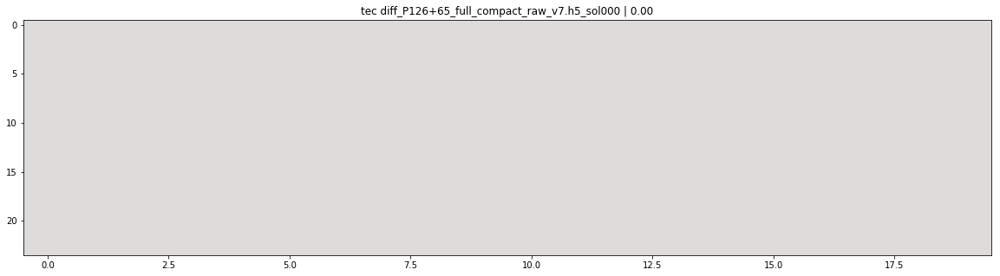

In [9]:
if __name__ == '__main__':
    
    select = dict(dir =slice(15, None, 1), 
                  ant =slice(51,None,1),  
                  time =slice(0,20,1),
                  freq =slice(None,None,1),
                  pol =slice(0,1,1))
    
    raw = '/net/lofar1/data1/albert/imaging/data/P126+65_compact_raw/P126+65_full_compact_raw_nederrijn.h5'
    
    datapack_raw = DataPack(raw, readonly=True)
    datapack_raw.current_solset = 'sol000'
    #Npol, Nd, Na, Nf, Nt
    datapack_raw.select(**select)
    phase_raw, axes = datapack_raw.phase
    amp_raw, axes = datapack_raw.amplitude
    timestamps, times = datapack_raw.get_times(axes['time'])
    _, freqs = datapack_raw.get_freqs(axes['freq'])
    datapack_raw.current_solset = 'data_posterior'
    tec_posterior, _ = datapack_raw.tec
    
    Yimag = amp_raw*np.sin(phase_raw)
    Yreal = amp_raw*np.cos(phase_raw)
#     np.savez("/home/albert/ftp/small_dataset.npz", Yimag=Yimag[0,:,:,:,10], Yreal=Yreal[0,:,:,:,10], freqs=freqs)
    
    smoothed = '/net/lofar1/data1/albert/imaging/data/P126+65_full_compact_smoothed.h5'
    datapack_smoothed = DataPack(smoothed, readonly=True)
    datapack_smoothed.current_solset = 'sol000'
    #Npol, Nd, Na, Nf, Nt
    datapack_smoothed.select(**select)
    phase_smooth, axes = datapack_smoothed.phase
    Yimag_smooth = np.sin(phase_smooth)
    Yreal_smooth = np.cos(phase_smooth)
    
    residuals = 0.5*np.mean(np.abs(Yimag_smooth - Yimag) + np.abs(Yreal_smooth - Yreal))
    print('mean abs residuals:', residuals)

    
    smoothed = '/net/lofar1/data1/albert/imaging/data/P126+65_full_compact_smoothed.h5'
    posterior_v1 = '/net/lofar1/data1/albert/imaging/data/P126+65_compact_raw/P126+65_full_compact_raw_nederrijn.h5'
    posterior_v2 = '/net/lofar1/data1/albert/imaging/data/P126+65_compact_raw/P126+65_full_compact_raw_nederrijn_v2.h5'
    posterior_v3 = '/net/lofar1/data1/albert/imaging/data/P126+65_compact_raw/P126+65_full_compact_raw_nederrijn_v3.h5'
    posterior_v5 = '/net/lofar1/data1/albert/imaging/data/P126+65_compact_raw/P126+65_full_compact_raw_v5.h5'
    posterior_v6 = '/net/lofar1/data1/albert/imaging/data/P126+65_compact_raw/P126+65_full_compact_raw_v6.h5'
    posterior_v7 = '/net/lofar1/data1/albert/imaging/data/P126+65_compact_raw/P126+65_full_compact_raw_v7.h5'

    
    datapacks = [smoothed, posterior_v5, posterior_v6, posterior_v7]
    solsets = ['sol000', 'data_posterior','data_posterior', 'sol000']
    
    def _w(p):
        return np.angle(np.exp(1j*p))
    
    phases = []
    diffs = []
    for s,d in zip(solsets,datapacks):
        datapack = DataPack(d, readonly=True)
        datapack.current_solset = s
        #Npol, Nd, Na, Nf, Nt
        datapack.select(**select)
        phase, axes = datapack.phase
        phases.append(_w(phase[0,0,0,:,:]))
        diffs.append(_w(_w(phase_raw)-_w(phase))[0,0,0,:,:])
        
        plt.figure(figsize=(20,5))
        plt.imshow(phases[-1],cmap='hsv',vmin=-np.pi,vmax=np.pi,aspect='auto')
        plt.title("_".join(['phase', os.path.basename(d),s]))
        plt.show()
        plt.figure(figsize=(20,5))
        plt.imshow(diffs[-1],cmap='hsv',vmin=-0.6,vmax=0.6,aspect='auto')
        plt.title("_".join(['diff',os.path.basename(d),s])+" | {:0.2f}".format(np.std(diffs[-1])))
        plt.show()
        plt.figure(figsize=(20,5))
        plt.imshow(diffs[-1]*freqs[:,None]/-8.448e6,cmap='coolwarm',vmin=-5.,vmax=5.,aspect='auto')
        plt.title("_".join(['tec diff',os.path.basename(d),s])+" | {:0.2f}".format(np.std(diffs[-1]*freqs[:,None]/-8.448e6)))
        plt.show()



    
    
    
    

In [23]:
list(datapack_raw.antennas[0]).index(b'RS406HBA')

56

In [29]:
phase[0,14,51,12,:] - phase[0,14,50,12,:] + phase[0,15,50,12,:] - phase[0,15,49,12,:] - phase[0,16,51,12,:] + phase[0,16,49,12,:]

array([-3.28314731e+00, -1.22171797e+01,  4.10265361e+00, -1.18393806e+01,
       -8.54296375e+00, -5.80038225e+00,  1.22674800e+01,  9.54772614e+00,
       -4.10577984e-01,  5.63245226e+00, -4.40137409e+00, -7.98691763e+00,
       -1.88141759e+00, -1.38499435e+01, -6.93294853e+00,  2.14598106e+00,
       -4.60069196e+00, -9.13659428e+00,  6.17616100e+00,  3.34436983e+00,
       -6.51697883e+00, -7.02754581e+00, -2.83184617e-01, -1.23415589e+01,
        6.32945698e-02, -5.42136282e-01,  5.24421822e+00, -1.36098084e+00,
       -5.19768695e+00, -1.60516794e+00, -1.52037288e+00, -1.57398906e+00,
       -5.06584724e+00, -7.62913565e+00,  1.39173206e+01,  4.78143527e+00,
       -7.50129340e+00,  4.76374279e+00, -8.18807877e+00,  5.79168402e-01,
       -2.27536985e+00, -5.74397174e+00,  1.06024926e+01, -7.99673888e+00,
        6.93613362e+00,  1.05963640e+01,  1.08919965e+01,  4.98218416e+00,
        1.79636205e+01, -6.83004495e+00, -1.65318536e+01,  7.87674008e-02,
       -1.25435403e+01,  

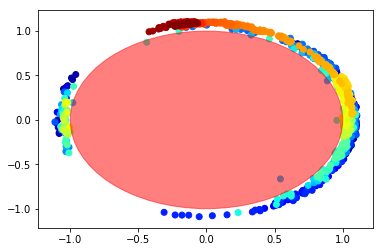

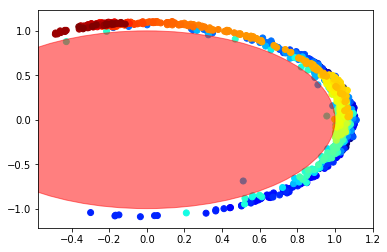

In [25]:
Yimag = amp_raw*np.sin(phase_raw)
Yreal = amp_raw*np.cos(phase_raw)
import matplotlib.pyplot as plt

circle1 = plt.Circle((0, 0), 1., color='r',alpha=0.5)
Yreal_ = amp_raw*np.cos(phases[-1])
Yimag_ = amp_raw*np.sin(phase[-1])

c = plt.Normalize(0,960)(np.arange(Yreal_.shape[-1]))

plt.scatter(Yreal_[0,0,0,12,:], Yimag_[0,0,0,12,:], cmap='jet', c=c)
plt.gca().add_artist(circle1)
plt.show()

plt.scatter(Yreal[0,0,0,12,:], Yimag[0,0,0,12,:], cmap='jet', c=c)
circle1 = plt.Circle((0, 0), 1., color='r',alpha=0.5)

plt.gca().add_artist(circle1)
plt.show()

In [45]:
b = np.mean(np.abs(np.diff(Yreal,axis=-1)) + np.abs(np.diff(Yimag,axis=-1)),axis=-1).mean(-1)/2.

In [46]:
b.shape

(1, 36, 62)

In [47]:
plt.hist(b[0,14,48,12].flatten())
plt.show()

IndexError: too many indices for array

In [48]:
b[0,:,48].flatten()

array([0.0965624 , 0.11303827, 0.08150745, 0.07358941, 0.07519475,
       0.13959474, 0.09231526, 0.15850966, 0.10904584, 0.14253576,
       0.1615403 , 0.13562671, 0.13681451, 0.10796584, 0.0501604 ,
       0.14244239, 0.13769016, 0.14519275, 0.13658726, 0.12948201,
       0.15131052, 0.14515167, 0.11538319, 0.10988324, 0.16482682,
       0.18622625, 0.12866548, 0.14172941, 0.11757164, 0.18583204,
       0.12358703, 0.13006182, 0.14458711, 0.14453612, 0.13539378,
       0.13333974])

In [92]:
# !pip install pymc3
import pymc3 as pm

import numpy as np
import pylab as plt
import theano.tensor as tt
import os

def infer_tec(freqs, Yimag, Yreal, tec_init = None, samples = 5000, output_folder = './infer_tec_output'):
    os.makedirs(output_folder, exist_ok=True)
    
    if tec_init is None:
        tec_init = np.zeros_like(Yreal).mean(-2)
    tec_shape = tec_init.shape
    tec_init_tt = tt.as_tensor_variable(tec_init)
    Nf = freqs.size
    
    with pm.Model():
        tec_uncert = pm.Exponential('tec_uncert', lam=1./10.)
        tec_m = pm.Normal('tec', mu=tt.as_tensor_variable(np.zeros_like(tec_init)),
                          sd = tec_uncert, shape=tec_shape)
        phase_m = (tec_init_tt[..., None,:] + tec_m[..., None, :])*-8.448e6/tt.as_tensor_variable(freqs[:, None])
        Yimag_m = pm.Deterministic('Yimag',pm.math.sin(phase_m))
        Yreal_m = pm.Deterministic('Yreal',pm.math.cos(phase_m))
        likelihood = pm.Laplace('Yreal_data', mu = Yreal_m, b=0.1, observed=Yreal) + pm.Laplace('Yimag_data', mu=Yimag_m, b = 0.1, observed=Yimag)
        trace = pm.sample(samples)
        
#     pm.traceplot(trace,combined=True)
#     plt.savefig(os.path.join(output_folder, 'traceplot.png'))
#     plt.close('all')
    tec_inferred = np.median(tec_init + trace.get_values('tec'), axis=0)
    tec_uncert = np.sqrt(np.mean(np.square(tec_init + trace.get_values('tec') - tec_inferred),axis=0))
#     plt.plot(tec_inferred - tec)
#     plt.savefig(os.path.join(output_folder,'residuals.png'))
#     plt.close('all')
    
    return tec_inferred, tec_uncert, np.median(trace.get_values('Yimag'), axis=0), np.median(trace.get_values('Yreal'), axis=0)

tec_inferred, tec_uncert, Yimag_inf, Yreal_inf = infer_tec(freqs, Yimag, Yreal, tec_init=tec_posterior, samples = 2000, output_folder = './infer_tec_output')


# res_tec, res_tec_uncert, res_Yimag, res_Yreal = [],[],[],[]

# for i in range(Yimag.shape[-1]):
#     tec_inferred, tec_uncert, Yimag_inf, Yreal_inf = infer_tec(freqs, Yimag[...,i:i+1], Yreal[...,i:i+1], tec_init=tec_posterior[...,i:i+1], samples = 2000, output_folder = './infer_tec_output')
#     res_tec.append(tec_inferred)
#     res_tec_uncert.append(tec_uncert)
#     res_Yimag.append(Yimag_inf)
#     res_Yreal.append(Yreal_inf)

# res_tec = np.concatenate(res_tec,axis=-1)
# res_tec_uncert = np.concatenate(res_tec_uncert,axis=-1)
# res_Yimag = np.concatenate(res_Yimag, axis=-1)
# res_Yreal = np.concatenate(res_Yreal, axis=-1)
# np.savez("extended_posterior.npz", tec_inf = res_tec, tec_uncert = res_tec_uncert, Yimag_inf = res_Yimag, Yreal_inf = res_Yreal)

/net/lofar1/data1/albert/miniconda3/envs/bayes_filter/lib/python3.6/importlib/_bootstrap.py:205: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)


KeyboardInterrupt: 

In [130]:
np.max((np.abs(np.load('extended_posterior.npz')['Yreal_inf'] - Yreal[...,:10]))
       + (np.abs(np.load('extended_posterior.npz')['Yimag_inf'] - Yimag[...,:10])))

2.8281033517891734

In [117]:
if __name__ == '__main__':
    smoothed = '/net/lofar1/data1/albert/imaging/data/P126+65_full_compact_smoothed.h5'
    posterior_v3 = '/net/lofar1/data1/albert/imaging/data/P126+65_compact_raw/P126+65_full_compact_raw_nederrijn_v3.h5'
    posterior_v4 = '/net/lofar1/data1/albert/imaging/data/P126+65_compact_raw/P126+65_full_compact_raw_nederrijn_v4.h5'
    
    
    datapack_smoothed = DataPack(smoothed, readonly=True)
    datapack_smoothed.current_solset = 'sol000'
    patch_names, directions = datapack_smoothed.directions
    patch_names, smooth_directions = datapack_smoothed.get_directions(patch_names)
    smooth_directions = np.stack([smooth_directions.ra.deg, smooth_directions.dec.deg],axis=1)
    #Npol, Nd, Na, Nf, Nt
    datapack_smoothed.select(dir=slice(None, None, 1), ant=slice(None, None,1), time=slice(0,200,1), freq=slice(None,None,1),pol=slice(0,1,1))
    phase_smoothed, axes = datapack_smoothed.phase
    
    datapack_posterior = DataPack(posterior_v3, readonly=True)
    datapack_posterior.current_solset = 'data_posterior'
    patch_names, directions = datapack_posterior.directions
    patch_names, smooth_directions = datapack_posterior.get_directions(patch_names)
    smooth_directions = np.stack([smooth_directions.ra.deg, smooth_directions.dec.deg],axis=1)
    #Npol, Nd, Na, Nf, Nt
    datapack_posterior.select(dir=slice(None, None, 1), ant=slice(None, None,1), time=slice(0,200,1), freq=slice(None,None,1),pol=slice(0,1,1))
    phase_posterior, axes = datapack_posterior.phase
    
    datapack_posterior = DataPack(posterior_v4, readonly=False)
    datapack_posterior.current_solset = 'data_posterior'
    #Npol, Nd, Na, Nf, Nt
    datapack_posterior.select(dir=slice(None, None, 1), ant=slice(None, None,1), time=slice(0,200,1), freq=slice(None,None,1),pol=slice(0,1,1))
    
    def w(p):
        return np.angle(np.exp(1j*p))
    
    datapack_posterior.phase = w(w(phase_posterior) - w(phase_smoothed))
    

    
    

/net/lofar1/data1/albert/miniconda3/envs/bayes_filter/lib/python3.6/site-packages/tables-3.4.5.dev0-py3.6-linux-x86_64.egg/tables/leaf.py:414: PerformanceWarning: The Leaf ``/sol000/phase000/val`` is exceeding the maximum recommended rowsize (104857600 bytes);
be ready to see PyTables asking for *lots* of memory and possibly slow
I/O.  You may want to reduce the rowsize by trimming the value of
dimensions that are orthogonal (and preferably close) to the *main*
dimension of this leave.  Alternatively, in case you have specified a
very small/large chunksize, you may want to increase/decrease it.
  PerformanceWarning)
/net/lofar1/data1/albert/miniconda3/envs/bayes_filter/lib/python3.6/site-packages/tables-3.4.5.dev0-py3.6-linux-x86_64.egg/tables/leaf.py:414: PerformanceWarning: The Leaf ``/data_posterior/phase000/val`` is exceeding the maximum recommended rowsize (104857600 bytes);
be ready to see PyTables asking for *lots* of memory and possibly slow
I/O.  You may want to reduce the row

In [118]:
from bayes_filter.plotting import animate_datapack

animate_datapack('/net/lofar1/data1/albert/imaging/data/P126+65_compact_raw/P126+65_full_compact_raw_v7.h5',
                 'tec_v7', 32, 
                labels_in_radec=True, plot_facet_idx=True, phase_wrap=False,
                observable='tec', solset='data_posterior')

W0612 14:02:40.096096 139719533414208 deprecation_wrapper.py:119] From /net/lofar1/data1/albert/miniconda3/envs/bayes_filter/lib/python3.6/site-packages/bayes_filter-0.0.1-py3.6.egg/bayes_filter/plotting.py:304: The name tf.logging.debug is deprecated. Please use tf.compat.v1.logging.debug instead.

W0612 14:02:40.101371 139719533414208 deprecation_wrapper.py:119] From /net/lofar1/data1/albert/miniconda3/envs/bayes_filter/lib/python3.6/site-packages/bayes_filter-0.0.1-py3.6.egg/bayes_filter/plotting.py:304: The name tf.logging.debug is deprecated. Please use tf.compat.v1.logging.debug instead.

I0612 14:02:40.114947 139719533414208 plotting.py:314] Applying selection: ant=None,time=[0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 160, 170, 180, 190],freq=None,dir=None,pol=None
I0612 14:02:40.120408 139719533414208 plotting.py:314] Applying selection: ant=None,time=[1, 11, 21, 31, 41, 51, 61, 71, 81, 91, 101, 111, 121, 131, 141, 151, 161, 171, 181, 191],freq=None,di

I0612 14:03:02.951026 139719533414208 plotting.py:466] Plotting 2016-12-08T23:29:44.006
I0612 14:03:02.958209 139719533414208 plotting.py:466] Plotting 2016-12-08T23:25:44.006
I0612 14:03:03.052590 139719533414208 plotting.py:466] Plotting 2016-12-08T23:27:44.006
I0612 14:03:03.116680 139719533414208 plotting.py:466] Plotting 2016-12-08T23:26:14.006
I0612 14:03:03.202976 139719533414208 plotting.py:466] Plotting 2016-12-08T23:28:44.006
I0612 14:03:03.366691 139719533414208 plotting.py:466] Plotting 2016-12-08T23:29:14.006
I0612 14:03:03.376247 139719533414208 plotting.py:466] Plotting 2016-12-08T23:30:14.006
I0612 14:03:03.756090 139719533414208 plotting.py:466] Plotting 2016-12-08T23:27:14.006
I0612 14:03:03.807783 139719533414208 plotting.py:466] Plotting 2016-12-08T23:28:14.006
I0612 14:03:04.125101 139719533414208 plotting.py:466] Plotting 2016-12-08T23:26:44.006
I0612 14:03:16.006957 139719533414208 plotting.py:466] Plotting 2016-12-08T23:31:14.006
I0612 14:03:16.136008 1397195334

I0612 14:06:58.613719 139719533414208 plotting.py:466] Plotting 2016-12-09T00:10:44.006
I0612 14:06:59.215263 139719533414208 plotting.py:466] Plotting 2016-12-09T00:13:44.006
I0612 14:06:59.716236 139719533414208 plotting.py:466] Plotting 2016-12-09T00:11:44.006
I0612 14:07:00.821927 139719533414208 plotting.py:466] Plotting 2016-12-09T00:15:14.006
I0612 14:07:02.142261 139719533414208 plotting.py:466] Plotting 2016-12-09T00:12:14.006
I0612 14:07:02.503152 139719533414208 plotting.py:466] Plotting 2016-12-09T00:11:14.006
I0612 14:07:11.554567 139719533414208 plotting.py:466] Plotting 2016-12-09T00:19:14.006
I0612 14:07:18.151069 139719533414208 plotting.py:466] Plotting 2016-12-09T00:17:44.006
I0612 14:07:20.738531 139719533414208 plotting.py:466] Plotting 2016-12-09T00:19:44.006
I0612 14:07:22.441806 139719533414208 plotting.py:466] Plotting 2016-12-09T00:18:14.006
I0612 14:07:22.962914 139719533414208 plotting.py:466] Plotting 2016-12-09T00:15:44.006
I0612 14:07:24.377435 1397195334

I0612 14:10:47.235021 139719533414208 plotting.py:466] Plotting 2016-12-09T00:56:14.006
I0612 14:10:47.275416 139719533414208 plotting.py:466] Plotting 2016-12-09T00:56:44.006
I0612 14:11:11.412665 139719533414208 plotting.py:538] diff_plot_phase_v3/animation.mp4 exists already


In [ ]:
if __name__ == '__main__':
    import os
    output_folder = './diagnostic_cyril'
    os.makedirs(output_folder,exist_ok=True)
    
    for j in range(14,36,1):
        for i in range(62):
            select = dict(dir=slice(j, j+1, 1), 
                          ant=slice(i, i+1,1),  
                          time=slice(None,None,1),
                          freq=slice(None,None,1),
                          pol=slice(0,1,1))

            raw = '/net/lofar1/data1/albert/imaging/data/P126+65_compact_raw/P126+65_full_compact_raw_nederrijn.h5'

            datapack_raw = DataPack(raw, readonly=True)
            datapack_raw.current_solset = 'sol000'
            #Npol, Nd, Na, Nf, Nt
            datapack_raw.select(**select)
            phase_raw, axes = datapack_raw.phase
            timestamps, times = datapack_raw.get_times(axes['time'])
            _, freqs = datapack_raw.get_freqs(axes['freq'])
            datapack_raw.current_solset = 'data_posterior'
            tec_posterior, _ = datapack_raw.tec


            smoothed = '/net/lofar1/data1/albert/imaging/data/P126+65_full_compact_smoothed.h5'
            posterior_v1 = '/net/lofar1/data1/albert/imaging/data/P126+65_compact_raw/P126+65_full_compact_raw_nederrijn.h5'
            posterior_v2 = '/net/lofar1/data1/albert/imaging/data/P126+65_compact_raw/P126+65_full_compact_raw_nederrijn_v2.h5'
            posterior_v3 = '/net/lofar1/data1/albert/imaging/data/P126+65_compact_raw/P126+65_full_compact_raw_nederrijn_v3.h5'

            datapacks = [smoothed]#, posterior_v1, posterior_v3]
            solsets = ['sol000']#, 'data_posterior', 'data_posterior']

            def _w(p):
                return np.angle(np.exp(1j*p))

            phases = []
            diffs = []
            for s,d in zip(solsets,datapacks):
                datapack = DataPack(d, readonly=True)
                datapack.current_solset = s
                #Npol, Nd, Na, Nf, Nt
                datapack.select(**select)
                phase, axes = datapack.phase
                phases.append(phase[0,0,0,:,:])
                diffs.append(_w(_w(phase_raw)-_w(phase))[0,0,0,:,:])

                fig, axs = plt.subplots(5, 1, figsize=(20,25))
                
                axs[0].imshow(phase_raw[0,0,0,:,:],cmap='hsv',vmin=-np.pi,vmax=np.pi,aspect='auto')
                axs[0].set_title('phase_raw')
                
                axs[1].imshow(phases[-1],cmap='hsv',vmin=-np.pi,vmax=np.pi,aspect='auto')
                axs[1].set_title("_".join(['phase', os.path.basename(d),s]))
                
                axs[2].imshow(diffs[-1],cmap='hsv',vmin=-np.pi,vmax=np.pi,aspect='auto')
                axs[2].set_title("_".join(['diff',os.path.basename(d),s])+" | {:0.2f}".format(np.std(diffs[-1])))
            
                axs[3].imshow(diffs[-1]*freqs[:,None]/-8.448e6,cmap='coolwarm',vmin=-5.,vmax=5.,aspect='auto')
                axs[3].set_title("_".join(['tec diff',os.path.basename(d),s])+" | {:0.2f}".format(np.std(diffs[-1]*freqs[:,None]/-8.448e6)))
                
                #phase = K tec / nu + 2 pi nu clock
                eff_tec = np.mean(diffs[-1]*freqs[:,None]/-8.448e6, axis=0)
                eff_phase = eff_tec[None, :] * -8.448e6/freqs[:, None]
                eff_clock = (_w(_w(phase_raw[0,0,0,:,:])-_w(eff_phase)))/(freqs[:,None]*2*np.pi)*1e9
                axs[4].imshow(eff_clock,cmap='coolwarm',vmin=-1.,vmax=1.,aspect='auto')
                axs[4].set_title("_".join(['clock [ns]',os.path.basename(d),s])+" | {:0.2f}".format(np.std(eff_clock)))
                
                
                plt.tight_layout()
                plt.savefig(os.path.join(output_folder, 'difference_{:02d}_ant{:02d}.png'.format(j,i)))
                plt.close('all')




    
    
    

/net/lofar1/data1/albert/miniconda3/envs/bayes_filter/lib/python3.6/site-packages/tables-3.4.5.dev0-py3.6-linux-x86_64.egg/tables/leaf.py:414: PerformanceWarning: The Leaf ``/sol000/phase000/val`` is exceeding the maximum recommended rowsize (104857600 bytes);
be ready to see PyTables asking for *lots* of memory and possibly slow
I/O.  You may want to reduce the rowsize by trimming the value of
dimensions that are orthogonal (and preferably close) to the *main*
dimension of this leave.  Alternatively, in case you have specified a
very small/large chunksize, you may want to increase/decrease it.
  PerformanceWarning)


SystemError: <built-in method write of _io.BufferedWriter object at 0x7f9ec0b2c7d8> returned a result with an error set

In [29]:
# !pip install pymc3
import pymc3 as pm

import numpy as np
import pylab as plt
import theano.tensor as tt
import os

def infer_tec(freqs, Yimag, Yreal, tec_init = None, samples = 5000, output_folder = './infer_tec_output'):
    os.makedirs(output_folder, exist_ok=True)
    
    if tec_init is None:
        tec_init = np.zeros_like(Yreal).mean(-2)
    tec_shape = tec_init.shape
    tec_init_tt = tt.as_tensor_variable(tec_init)
    Nf = freqs.size
    
    
    with pm.Model():
        freqs_tt = tt.as_tensor_variable(freqs[:, None]/1e6)
        tec_uncert = pm.Exponential('tec_uncert', lam=1./10.)
        tec_m = pm.Deterministic('tec',tec_init_tt + tec_uncert * pm.Normal('tec_', shape=tec_shape))
        clock_uncert = pm.Exponential('clock_uncert', lam=1./1.)
        clock_m = pm.Deterministic('clock',tec_uncert*pm.Normal('clock_', shape=tec_shape))
        phase_m = tec_m[..., None, :]*-8.448/freqs_tt + (2*np.pi)*freqs_tt*clock_m[...,None,:]/1e3
        
        Yimag_m = pm.Deterministic('Yimag',pm.math.sin(phase_m))
        Yreal_m = pm.Deterministic('Yreal',pm.math.cos(phase_m))
        likelihood = pm.Laplace('Yreal_data', mu = Yreal_m, b=0.02, observed=Yreal) + pm.Laplace('Yimag_data', mu=Yimag_m, b = 0.02, observed=Yimag)
        trace = pm.sample(samples, cores=32)
        
        return trace.get_values('tec'), trace.get_values('clock')

select = dict(dir=slice(14,15, 1), 
              ant=slice(56,57,1),  
              time=slice(None,100,1),
              freq=slice(None,None,1),
              pol=slice(0,1,1))

raw = '/net/lofar1/data1/albert/imaging/data/P126+65_compact_raw/P126+65_full_compact_raw_nederrijn.h5'

datapack_raw = DataPack(raw, readonly=True)
datapack_raw.current_solset = 'sol000'
#Npol, Nd, Na, Nf, Nt
datapack_raw.select(**select)
phase_raw, axes = datapack_raw.phase
timestamps, times = datapack_raw.get_times(axes['time'])
_, freqs = datapack_raw.get_freqs(axes['freq'])

Yimag = np.sin(phase_raw)
Yreal = np.cos(phase_raw)

tec_init = np.mean(phase_raw * freqs[:, None]/-8.448e6,axis=-2)

tec_inf, clock_inf = infer_tec(freqs, Yimag, Yreal, tec_init=tec_init, samples = 500)


# res_tec, res_tec_uncert, res_Yimag, res_Yreal = [],[],[],[]

# for i in range(Yimag.shape[-1]):
#     tec_inferred, tec_uncert, Yimag_inf, Yreal_inf = infer_tec(freqs, Yimag[...,i:i+1], Yreal[...,i:i+1], tec_init=tec_posterior[...,i:i+1], samples = 2000, output_folder = './infer_tec_output')
#     res_tec.append(tec_inferred)
#     res_tec_uncert.append(tec_uncert)
#     res_Yimag.append(Yimag_inf)
#     res_Yreal.append(Yreal_inf)

# res_tec = np.concatenate(res_tec,axis=-1)
# res_tec_uncert = np.concatenate(res_tec_uncert,axis=-1)
# res_Yimag = np.concatenate(res_Yimag, axis=-1)
# res_Yreal = np.concatenate(res_Yreal, axis=-1)
# np.savez("extended_posterior.npz", tec_inf = res_tec, tec_uncert = res_tec_uncert, Yimag_inf = res_Yimag, Yreal_inf = res_Yreal)

/net/lofar1/data1/albert/miniconda3/envs/bayes_filter/lib/python3.6/site-packages/tables-3.4.5.dev0-py3.6-linux-x86_64.egg/tables/leaf.py:414: PerformanceWarning: The Leaf ``/sol000/phase000/val`` is exceeding the maximum recommended rowsize (104857600 bytes);
be ready to see PyTables asking for *lots* of memory and possibly slow
I/O.  You may want to reduce the rowsize by trimming the value of
dimensions that are orthogonal (and preferably close) to the *main*
dimension of this leave.  Alternatively, in case you have specified a
very small/large chunksize, you may want to increase/decrease it.
  PerformanceWarning)

Sampling 32 chains:   8%|█████████▎                                                                                                                | 2431/32000 [00:09<02:37, 187.56draws/s]


Sampling 32 chains:  13%|████████████████                                                                                                          | 4223/32000 [00:18<02:02, 226.78draws/s]


Sampling 32 chains:  24%|█████████████████████████████▎                                                                                            | 7673/32000 [00:27<00:53, 457.06draws/s]


Sampling 32 chains:  36%|████████████████████████████████████████████                                                                             | 11640/32000 [00:38<01:53, 179.55draws/s]


Sampling 32 chains:  40%|████████████████████████████████████████████████▍                                                                         | 12707/32000 [00:52<10:46, 29.86draws/s]


Sampling 32 chains:  41%|█████████████████████████████████████████████████▉                                                                        | 13114/32000 [01:04<09:22, 33.57draws/s]


Sampling 32 chains:  42%|███████████████████████████████████████████████████▌                                                                      | 13534/32000 [01:16<08:09, 37.75draws/s]


Sampling 32 chains:  44%|█████████████████████████████████████████████████████▏                                                                    | 13936/32000 [01:27<09:10, 32.80draws/s]


Sampling 32 chains:  45%|██████████████████████████████████████████████████████▊                                                                   | 14371/32000 [01:39<07:45, 37.91draws/s]


Sampling 32 chains:  46%|████████████████████████████████████████████████████████▍                                                                 | 14789/32000 [01:51<10:01, 28.60draws/s]


Sampling 32 chains:  48%|█████████████████████████████████████████████████████████▉                                                                | 15207/32000 [02:03<07:49, 35.73draws/s]


Sampling 32 chains:  49%|███████████████████████████████████████████████████████████▌                                                              | 15616/32000 [02:15<10:06, 27.04draws/s]


Sampling 32 chains:  50%|█████████████████████████████████████████████████████████████▏                                                            | 16042/32000 [02:27<06:47, 39.14draws/s]


Sampling 32 chains:  52%|██████████████████████████████████████████████████████████████▊                                                           | 16488/32000 [02:39<07:46, 33.25draws/s]


Sampling 32 chains:  53%|████████████████████████████████████████████████████████████████▍                                                         | 16906/32000 [02:51<06:43, 37.44draws/s]


Sampling 32 chains:  54%|██████████████████████████████████████████████████████████████████                                                        | 17339/32000 [03:03<06:50, 35.75draws/s]


Sampling 32 chains:  55%|███████████████████████████████████████████████████████████████████▋                                                      | 17750/32000 [03:15<07:00, 33.88draws/s]


Sampling 32 chains:  57%|█████████████████████████████████████████████████████████████████████▎                                                    | 18173/32000 [03:26<07:49, 29.43draws/s]


Sampling 32 chains:  58%|██████████████████████████████████████████████████████████████████████▉                                                   | 18598/32000 [03:38<06:00, 37.15draws/s]


Sampling 32 chains:  60%|████████████████████████████████████████████████████████████████████████▋                                                 | 19058/32000 [03:51<05:51, 36.84draws/s]


Sampling 32 chains:  61%|██████████████████████████████████████████████████████████████████████████▎                                               | 19490/32000 [04:03<05:54, 35.26draws/s]


Sampling 32 chains:  62%|███████████████████████████████████████████████████████████████████████████▉                                              | 19908/32000 [04:15<05:12, 38.69draws/s]


Sampling 32 chains:  64%|█████████████████████████████████████████████████████████████████████████████▌                                            | 20333/32000 [04:27<05:10, 37.52draws/s]


Sampling 32 chains:  65%|███████████████████████████████████████████████████████████████████████████████▏                                          | 20782/32000 [04:39<05:10, 36.09draws/s]


Sampling 32 chains:  66%|████████████████████████████████████████████████████████████████████████████████▉                                         | 21225/32000 [04:52<04:37, 38.88draws/s]


Sampling 32 chains:  68%|██████████████████████████████████████████████████████████████████████████████████▋                                       | 21677/32000 [05:04<05:18, 32.44draws/s]


Sampling 32 chains:  69%|████████████████████████████████████████████████████████████████████████████████████▏                                     | 22083/32000 [05:16<05:11, 31.80draws/s]


Sampling 32 chains:  70%|█████████████████████████████████████████████████████████████████████████████████████▉                                    | 22533/32000 [05:28<04:30, 35.00draws/s]


Sampling 32 chains:  72%|███████████████████████████████████████████████████████████████████████████████████████▌                                  | 22960/32000 [05:40<04:19, 34.84draws/s]


Sampling 32 chains:  73%|█████████████████████████████████████████████████████████████████████████████████████████▏                                | 23382/32000 [05:52<04:18, 33.37draws/s]


Sampling 32 chains:  74%|██████████████████████████████████████████████████████████████████████████████████████████▊                               | 23807/32000 [06:04<03:40, 37.14draws/s]


Sampling 32 chains:  76%|████████████████████████████████████████████████████████████████████████████████████████████▎                             | 24226/32000 [06:16<03:45, 34.47draws/s]


Sampling 32 chains:  77%|██████████████████████████████████████████████████████████████████████████████████████████████                            | 24664/32000 [06:28<03:45, 32.47draws/s]


Sampling 32 chains:  78%|███████████████████████████████████████████████████████████████████████████████████████████████▌                          | 25061/32000 [06:39<03:40, 31.46draws/s]


Sampling 32 chains:  80%|█████████████████████████████████████████████████████████████████████████████████████████████████                         | 25472/32000 [06:51<02:57, 36.78draws/s]


Sampling 32 chains:  81%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 25863/32000 [07:02<03:17, 31.00draws/s]


Sampling 32 chains:  82%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 26301/32000 [07:14<02:40, 35.51draws/s]


Sampling 32 chains:  84%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 26729/32000 [07:26<02:22, 37.11draws/s]


Sampling 32 chains:  85%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 27160/32000 [07:38<02:14, 35.94draws/s]


Sampling 32 chains:  86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 27578/32000 [07:49<02:04, 35.41draws/s]


Sampling 32 chains:  87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 27994/32000 [08:01<01:59, 33.66draws/s]


Sampling 32 chains:  89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 28418/32000 [08:13<01:53, 31.51draws/s]


Sampling 32 chains:  90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 28855/32000 [08:25<01:24, 37.21draws/s]


Sampling 32 chains:  91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 29274/32000 [08:37<01:20, 34.04draws/s]


Sampling 32 chains:  93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 29703/32000 [08:49<01:03, 35.94draws/s]


Sampling 32 chains:  94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 30134/32000 [09:01<00:56, 32.86draws/s]


Sampling 32 chains:  95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 30557/32000 [09:13<00:40, 35.87draws/s]


Sampling 32 chains:  97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 31008/32000 [09:26<00:33, 29.20draws/s]


Sampling 32 chains:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 31491/32000 [09:40<00:17, 28.52draws/s]


Sampling 32 chains: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 31977/32000 [10:08<00:02,  8.44draws/s]


Sampling 32 chains: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 32000/32000 [10:12<00:00,  3.83draws/s]W0614 02:24:41.056066 140535266064192 report.py:143] The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
W0614 02:24:41.061328 140535266064192 report.py:143] The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
W0614 02:24:41.062532 140535266064192 report.py:143] The acceptance probability does not match the target. It is 0.6563039666552881, but should be close to 0.8. Try to increase the number of tuning steps.
W0614 02:24:41.063397 140535266064192 report.py:143] The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
W0614 02:24:41.064302 140535266064192 report.py:143] The acceptance probability does not match the target. It is 0.890855168

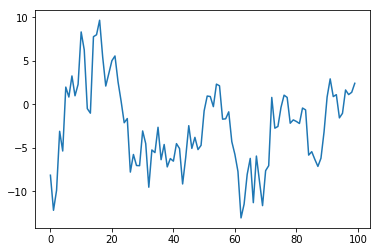

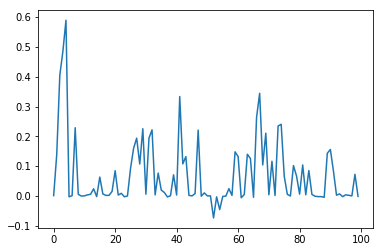

In [30]:
plt.plot(np.median(tec_inf[:,0,0,0,:],axis=0))
plt.show()
plt.plot(np.median(clock_inf[:,0,0,0,:],axis=0))
plt.show()

In [47]:
def natural_adam_stochastic_gradient_descent_with_linesearch(
        loss_fn,
        adam_params,
        iters=100,
        learning_rate=0.1,
        beta1=0.9,
        beta2=0.999,
        epsilon=1e-8,
        stop_patience=3,
        parallel_iterations=10,
        search_size=5):
    """
    Inspired by https://arxiv.org/pdf/1803.09151.pdf
    uses linesearch
    :param log_prob:
    :param initial_state:
    :param iters:
    :param stepsizes:
    :param learning_rate:
    :param parallel_iterations:
    :return:
    """

    learning_rate = tf.convert_to_tensor(learning_rate, float_type, 'learning_rate')
    stop_patience = tf.convert_to_tensor(stop_patience, tf.int32, 'stop_patience')
    iters = tf.convert_to_tensor(iters, tf.int32, 'iters')
    beta1 = tf.convert_to_tensor(beta1, float_type, 'beta1')
    beta2 = tf.convert_to_tensor(beta2, float_type, 'beta2')
    epsilon = tf.convert_to_tensor(epsilon, float_type, 'epsilon')


    if not isinstance(adam_params, (tuple, list)):
        raise ValueError('adam params should be list like')

    adam_params = list(adam_params)

    m0 = [tf.zeros_like(v) for v in adam_params]
    v0 = [tf.zeros_like(v) for v in adam_params]

    def _body(t, adam_params, m, v, loss_ta, min_loss, patience):

        loss = tf.reduce_mean(loss_fn(*adam_params))
        loss_better = tf.less_equal(loss, min_loss)
        min_loss = tf.minimum(min_loss, loss)
        patience = tf.cond(loss_better, lambda: tf.constant(0, patience.dtype),
                           lambda: patience + tf.constant(1, patience.dtype))

        loss_ta = loss_ta.write(t, loss)

        adam_grads = tf.gradients(loss, adam_params)
        pert_grads = []
        for g_t in adam_grads:
            if g_t is None:
                pert_grads.append(g_t)
                continue
            pert_grads.append(g_t + tf.constant(0.01,float_type)*tf.math.abs(g_t)*tf.random.normal(shape=tf.shape(g_t)))

        next_adam_params, next_m, next_v = _adam_update(adam_grads, adam_params, m, t, v, loss)
        [n.set_shape(p.shape) for n, p in zip(next_adam_params, adam_params)]

        return t+1, next_adam_params, next_m, next_v, loss_ta, min_loss, patience

    def _adam_update(adam_grads, adam_params, m, t, v, loss0):
        t_float = tf.cast(t, float_type) + 1.
        lr_t = tf.math.sqrt(1. - tf.math.pow(beta2, t_float)) * \
               tf.math.reciprocal(tf.math.sqrt(1. - tf.math.pow(beta1, t_float)))
        next_m, next_v = [], []
        for (m_t, v_t, g_t) in zip(m, v, adam_grads):
            if g_t is None:
                next_m.append(m_t)
                next_v.append(v_t)
                continue

            m_t = beta1 * m_t + (1. - beta1) * g_t
            v_t = beta2 * v_t + (1. - beta2) * tf.math.square(g_t)
            next_m.append(m_t)
            next_v.append(v_t)

            # p_t = p_t - lr_t * m_t * tf.math.reciprocal(tf.math.sqrt(v_t) + epsilon)

        def search_function(a):
            #TODO: don't need to redo predictive x because nat_params fixed
            test_adam_params = []
            for (m_t, v_t, p_t, g_t) in zip(next_m, next_v, adam_params, adam_grads):
                if g_t is None:
                    test_adam_params.append(p_t)
                    continue
                test_adam_params.append(p_t - a * lr_t * m_t * tf.math.reciprocal(tf.math.sqrt(v_t) + epsilon))
            loss = tf.reduce_mean(loss_fn(*test_adam_params))
            return loss - loss0

        search_space = tf.math.exp(tf.cast(tf.linspace(tf.math.log(learning_rate) - 7., tf.math.log(learning_rate), search_size), float_type))
        search_results = tf.map_fn(search_function, search_space, parallel_iterations=search_size)
        argmin = tf.argmin(search_results)

        a = search_space[argmin]
        loss_min = search_results[argmin]

        with tf.control_dependencies([tf.print('Step:', t, 'Optimal', 'Learning rate:', a, 'loss reduction', loss_min, 'from loss:', loss0)]):
            next_adam_params = []
            for (m_t, v_t, p_t, g_t) in zip(next_m, next_v, adam_params, adam_grads):
                if g_t is None:
                    next_adam_params.append(p_t)
                    continue
                next_adam_params.append(p_t - a * lr_t * m_t * tf.math.reciprocal(tf.math.sqrt(v_t) + epsilon))

        return next_adam_params, next_m, next_v

    def _cond(t, adam_params, m, v, loss_ta, min_loss, patience):
        return tf.logical_and(tf.less(patience, stop_patience), tf.less(t, iters))

    loss_ta = tf.TensorArray(dtype=float_type, size=iters, infer_shape=False,element_shape=())

    _, adam_params, m, v, loss_ta, _, _ = tf.while_loop(_cond,
                                    _body,
                                    (tf.constant(0, dtype=tf.int32),
                                     adam_params,
                                     m0,
                                     v0,
                                     loss_ta,
                                     tf.constant(np.inf,float_type),
                                     tf.constant(0, tf.int32)),
                                    parallel_iterations=parallel_iterations,
                                    back_prop=False,
                                    return_same_structure=True)

    return adam_params, loss_ta.stack()

In [7]:
from bayes_filter.sgd import adam_stochastic_gradient_descent_with_linesearch

In [42]:
###
# TF based solver clock and tec or just tec
import tensorflow as tf
import tensorflow_probability as tfp
import numpy as np
from bayes_filter.datapack import DataPack
import pylab as plt

float_type = tf.float64

def infer_tec_and_clock(freqs, Yimag, Yreal, gain_uncert = 0.02):
    #Npol, Nd, Na, Nf, Nt -> Nd, Na, Npol, Nt, Nf
    Yimag = np.transpose(Yimag, (1, 2, 0, 4, 3))
    Yreal = np.transpose(Yreal, (1, 2, 0, 4, 3))
    shape = Yimag.shape
    Nd, Na ,Npol, Nt, Nf = shape
    #Nd, Nt*Na*Npol, Nf
    Yimag = Yimag.reshape((Nd, Nt*Na*Npol, Nf))
    Yreal = Yreal.reshape((Nd, Nt*Na*Npol, Nf))
    #Nd, Nt*Na*Npol
    tec_init = np.mean(np.arctan2(Yimag, Yreal)*freqs/-8.4479745e6,axis=-1)
    
    with tf.Session(graph=tf.Graph()) as sess:
        tec_init_pl = tf.placeholder(float_type, shape=tec_init.shape,name='tec_init')
        Yimag_pl = tf.placeholder(float_type, shape=Yimag.shape,name='Yimag')
        Yreal_pl = tf.placeholder(float_type, shape=Yreal.shape,name='Yreal')    
        freqs = tf.constant(freqs,float_type,name='freqs')
        data_uncert = tf.constant(gain_uncert,float_type,name='data_uncert')
        tec_conv = tf.constant(-8.4479745e6, float_type)*tf.math.reciprocal(freqs)
        clock_conv = tf.constant(2.*np.pi*1e-9, float_type)*freqs
    
        tec_uncert_bij = tfp.bijectors.Chain(
                             [tfp.bijectors.AffineScalar(scale=tf.constant(10., float_type)),tfp.bijectors.Softplus()])
        clock_uncert_bij = tfp.bijectors.Chain(
                             [tfp.bijectors.AffineScalar(scale=tf.constant(1., float_type)),tfp.bijectors.Softplus()])
        
        def log_prob(tec_, clock_, tec_uncert_, clock_uncert_):
            
            tec_uncert = tec_uncert_bij.forward(tec_uncert_)
            clock_uncert = clock_uncert_bij.forward(clock_uncert_)
            
            tec =  tec_init_pl + tec_ + tec_uncert*tf.random.normal(shape=tf.shape(tec_),dtype=float_type)
            clock =  clock_ + clock_uncert*tf.random.normal(shape=tf.shape(clock_),dtype=float_type)
            
            phase_m = tec_conv*tec[...,None] + clock_conv*clock[...,None]
            Yimag_m = tf.sin(phase_m)
            Yreal_m = tf.cos(phase_m)
            
            Yimag_dist = tfp.distributions.Laplace(loc=Yimag_pl, scale=data_uncert)
            Yreal_dist = tfp.distributions.Laplace(loc=Yreal_pl, scale=data_uncert)
            
            tec_uncert_dist = tfp.distributions.Exponential(tf.constant(1./10.,float_type))
            clock_uncert_dist = tfp.distributions.Exponential(tf.constant(1.,float_type))
            
            likelihood = [tf.reduce_sum(tec_uncert_dist.log_prob(tec_uncert) - tec_uncert_bij.inverse_log_det_jacobian(tec_uncert, 0)),
                         tf.reduce_sum(clock_uncert_dist.log_prob(clock_uncert) - clock_uncert_bij.inverse_log_det_jacobian(clock_uncert, 0)),
                         tf.reduce_sum(Yimag_dist.log_prob(Yimag_m)),
                         tf.reduce_sum(Yreal_dist.log_prob(Yreal_m))]
#             likelihood = [tf.reduce_sum(Yimag_dist.log_prob(Yimag)),
#                          tf.reduce_sum(Yreal_dist.log_prob(Yreal))]
            log_prob_ = tf.accumulate_n(likelihood, shape=())
            return -tf.identity(log_prob_)
            
        init_state = [40.*tf.random.normal((32, Nd, Nt*Na*Npol), dtype=float_type), 
                      1.*tf.random.normal((32, 1, Nt*Na*Npol), dtype=float_type),
                      tf.random.normal((32, Nd, Nt*Na*Npol), dtype=float_type),
                      tf.random.normal((32, 1, Nt*Na*Npol), dtype=float_type)
                     ]
        
        (final_tec, final_clock, final_tec_uncert_, final_clock_uncert_), loss = adam_stochastic_gradient_descent_with_linesearch(log_prob, init_state,
                                                                                     learning_rate=0.2, 
                                                                                     iters=1000, search_size=10, stop_patience=15)
        
        
#         hmc = tfp.mcmc.SimpleStepSizeAdaptation(tfp.mcmc.HamiltonianMonteCarlo(
#             target_log_prob_fn = log_prob,
#             num_leapfrog_steps=10,
#             step_size=tf.constant(0.1,float_type)),
#             num_adaptation_steps=500,
#             target_accept_prob=tf.constant(0.65,float_type),
#             adaptation_rate=tf.constant(0.01,float_type))
        
#         init_state = [40.*tf.random.normal((32,)+tec_shape, dtype=float_type), 
#                       1.*tf.random.normal((32,)+tec_shape, dtype=float_type),
                      
#                       1.*tf.random.normal((32,1), dtype=float_type),
                      
#                       1.*tf.random.normal((32,1), dtype=float_type)
#                      ]

#         samples = tfp.mcmc.sample_chain(num_results=samples,
#                                        num_burnin_steps=500,
#                                        trace_fn=None,
#                                        return_final_kernel_results=False,
#                                        current_state=init_state,
#                                        kernel=hmc,
#                                        parallel_iterations=32)
        tec_shape = (Nd, Na, Npol, Nt)
        tec_perm = (2, 0, 1, 3)
        clock_shape = (1, Na, Npol, Nt)
        clock_perm = (2, 0, 1, 3)
    
        (tec, clock, tec_uncert, clock_uncert), loss = sess.run([(final_tec + tec_init_pl, final_clock, tec_uncert_bij.forward(final_tec_uncert_), clock_uncert_bij.forward(final_clock_uncert_)), loss], feed_dict={Yimag_pl:Yimag.astype(np.float64),
                                    Yreal_pl:Yreal.astype(np.float64),
                                    tec_init_pl:tec_init.astype(np.float64)})
        return np.median(tec, axis=0).reshape(tec_shape).transpose(tec_perm), np.median(clock,axis=0).reshape(clock_shape).transpose(clock_perm), np.median(tec_uncert, axis=0).reshape(tec_shape).transpose(tec_perm), np.median(clock_uncert,axis=0).reshape(clock_shape).transpose(clock_perm), loss

#         res = sess.run(dict(tec=samples[0], 
#                            clock=samples[1]),
#                       feed_dict={Yimag_pl:Yimag.astype(np.float64),
#                                     Yreal_pl:Yreal.astype(np.float64),
#                                     tec_init_pl:tec_init.astype(np.float64)})
    
    
save_datapack = '/net/lofar1/data1/albert/imaging/data/P126+65_compact_raw/P126+65_full_compact_raw_v5.h5'


select = dict(dir=slice(None,None, 1), 
              ant=slice(None,None,1),  
              time=slice(0,11,1),
              freq=slice(None,None,1),
              pol=slice(0,1,1))

raw = '/net/lofar1/data1/albert/imaging/data/P126+65_compact_raw/P126+65_full_compact_raw_nederrijn.h5'



datapack_raw = DataPack(raw, readonly=True)
datapack_raw.current_solset = 'sol000'
#Npol, Nd, Na, Nf, Nt
datapack_raw.select(**select)
phase_raw, axes = datapack_raw.phase
timestamps, times = datapack_raw.get_times(axes['time'])
_, freqs = datapack_raw.get_freqs(axes['freq'])

Yimag = np.sin(phase_raw)
Yreal = np.cos(phase_raw)

np.savez("/home/albert/ftp/small_dataset.npz", Yimag=Yimag[0,:,:,:,10], Yreal=Yreal[0,:,:,:,10], freqs=freqs)
    

# tec, clock, tec_uncert, clock_uncert, loss = infer_tec_and_clock(freqs, Yimag, Yreal)

# tec_conv = -8.4479745e6/freqs[:,None]
# clock_conv = 2*np.pi*freqs[:,None]*1e-9

# phase = tec[...,None,:]*tec_conv + clock[..., None,:]*clock_conv

# def _w(p):
#     return np.angle(np.exp(1j*p))

# diff = _w(_w(phase) - _w(phase_raw))

# print(diff.std())

# plt.imshow(diff[0,14,48,:,:],vmin=-np.pi,vmax=np.pi,cmap='hsv',aspect='auto')
# plt.show()
    
#     datapack_save = DataPack(save_datapack, readonly=False)
#     datapack_save.current_solset = 'sol000'
#     #Npol, Nd, Na, Nf, Nt
#     datapack_save.select(**select)
#     datapack_save.phase = phase
#     datapack_save.tec = tec


In [27]:
print(tec)

# phase = tec[...,None,:]*tec_conv + clock[..., None,:]*clock_conv

[[[[ -1.34567147]
   [  0.55402548]
   [  0.11458992]
   ...
   [ -0.66565016]
   [ -9.27325721]
   [  4.05116304]]

  [[ -1.03516004]
   [  1.94597807]
   [  2.32879662]
   ...
   [  4.44501306]
   [-13.93303698]
   [ -1.35961834]]

  [[  1.19460772]
   [ -3.96855414]
   [ -0.95043713]
   ...
   [  2.01958248]
   [-22.76325735]
   [ -9.61598069]]

  ...

  [[ -1.26998626]
   [  2.08031884]
   [ -1.18356657]
   ...
   [  0.29108671]
   [ -2.09071516]
   [ -4.89647483]]

  [[ -0.35223507]
   [ -0.21754807]
   [ -1.70862982]
   ...
   [  0.65296098]
   [-35.41811444]
   [-33.74133725]]

  [[  4.84047071]
   [  8.33683234]
   [ -2.43655948]
   ...
   [  3.31317168]
   [ -1.49511182]
   [ -2.54221852]]]]


In [284]:
datapack = DataPack('/net/lofar1/data1/albert/imaging/data/P126+65_compact_raw/P126+65_full_compact_raw_v6.h5')
datapack.current_solset='sol000'
select = dict(ant=slice(61,62, 1),
             dir=slice(None, None,1),
             time=slice(0,960,1),
             freq=slice(None,None,1)
             )
datapack.select(**select)
phase_raw, axes= datapack.phase
amp_raw,_ = datapack.amplitude
_, freqs = datapack.get_freqs(axes['freq'])
datapack.current_solset='data_posterior'
phase_post, axes= datapack.phase
_, directions = datapack.get_directions(axes['dir'])
directions = np.stack([directions.ra.rad, directions.dec.rad], axis=1)
_, times = datapack.get_times(axes['time'])
times = (times.mjd - times.mjd[0])*86400.
tec, _ = datapack.tec
tec_uncert, _ = datapack.weights_tec

tec_reinouts = np.load('/net/rijn/data2/rvweeren/P126+65_recall/ClockTEC/TECBay.npy')
datapack.select()
datapack.tec = tec_reinouts[None,...]*1e3

# block_size = 5
# from collections import deque
# h = deque(maxlen=block_size)
# for t in range(0,960):
#     if len(h) < block_size:
#         h.append(tec[0,...,t])
#         continue
#     time_slice = slice(t - block_size, t, 1)
#     past_coords = times[time_slice]
#     #N, 3
#     A = np.stack([past_coords**2, past_coords, np.ones(block_size)], axis=1)
#     #1, 3
#     new_A = np.stack([times[t:t+1]**2, times[t:t+1], np.ones((1,))], axis=1)
#     # K, block_size
#     u = np.stack(list(h), axis=-1).reshape((-1, block_size))
#     # [N,3][3, K] = [N, K]
#     coeffs, residuals, _, _ = np.linalg.lstsq(A, u.T)#3, Npol*Nd*Na
#     #Nd,Na
#     s = np.sqrt(residuals/block_size).reshape(tec.shape[1:3])
#     #Nd,Na
#     new_u_mean = np.reshape(np.matmul(new_A, coeffs).T, tec.shape[1:3])
#     new_du = np.abs(new_u_mean - tec[0,...,t])
#     mask = new_du > 5.*s
#     h.append(tec[0,...,t].copy())
# #     print(h[-1].shape, mask.shape)
#     (h[-1])[mask] = new_du[mask]
#     tec[0, mask, t] = np.nan
    
    
#     q = np.maximum(20.,np.percentile(u, 90, axis=-1, keepdims=True))
#     mask = u > q
#     tec[0,..., t-block_size+1:t+1][mask] = np.nan
    



# from scipy.spatial import cKDTree


# kd = cKDTree(directions)
# d, i = kd.query(directions,3)
# i = i[:,1:]

# def moving_average(x, w=10):
#     return np.convolve(x, np.ones(w), 'same') / w

# #threshold
# b1 = np.median(np.abs(tec[0,...] - tec[0, i[:,0], ...]), axis=0,keepdims=True)
# b2 = np.median(np.abs(tec[0,...] - tec[0, i[:,1], ...]), axis=0,keepdims=True)


# mask1 = np.abs(tec[0,...] - tec[0, i[:,0], ...]) > 4.*b1
# mask2 = np.abs(tec[0,...] - tec[0, i[:,1], ...]) > 4.*b2
# # mask2 = np.abs(tec[0,...] - tec[0, i[:,1], ...]) > 
# # tec = tec[0, ...].copy()
# tec[0,np.logical_and(mask1,mask2)] = np.nan



Yreal_post = amp_raw*np.cos(phase_post)
Yimag_post = amp_raw*np.sin(phase_post)
Yreal_raw = amp_raw * np.cos(phase_raw)
Yimag_raw = amp_raw * np.sin(phase_raw)
diff_real = Yreal_post - Yreal_raw
diff_imag = Yimag_post - Yimag_raw

def w(p):
    return np.angle(np.exp(1j*p))

# phi + d14 - (tec - d14)
# phi - tec
diff = w(w(phase_raw) - w(phase_post))

tec_conv = -8.4479745e6/freqs[:,None]
eff_tec = diff/tec_conv
phase_tec = tec[...,None,:]*tec_conv

diff_correctec = w(w(phase_raw - phase_raw[:, 3:4,...]) - w(phase_tec))

eff_tec_corrected = diff_correctec/tec_conv



In [281]:
np.load('/net/rijn/data2/rvweeren/P126+65_recall/ClockTEC/TECBay.npy').shape


(36, 62, 960)

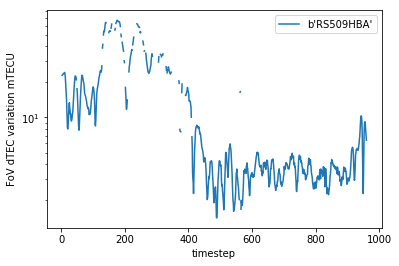

In [258]:
plt.plot(np.std(tec[0,...],axis=0).T)
plt.yscale('log')
plt.ylabel('FoV dTEC variation mTECU')
plt.xlabel('timestep')
plt.legend(axes['ant'])
plt.show()

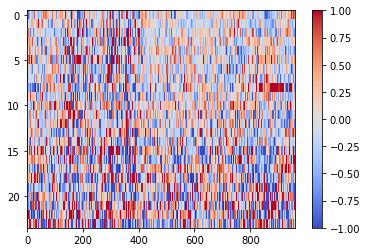

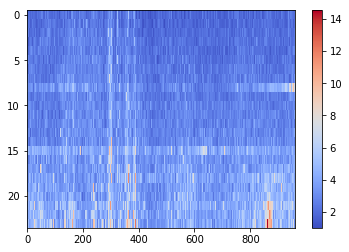

0


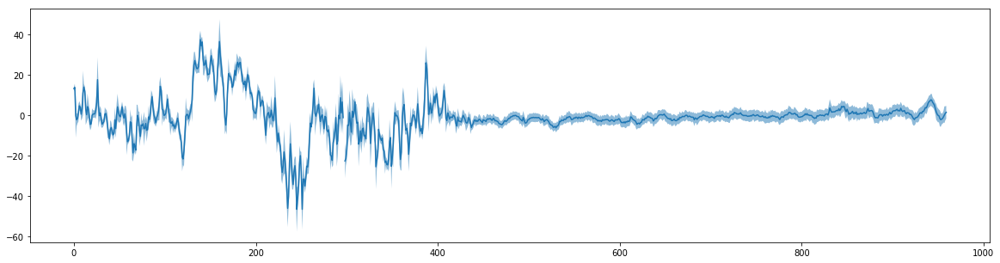

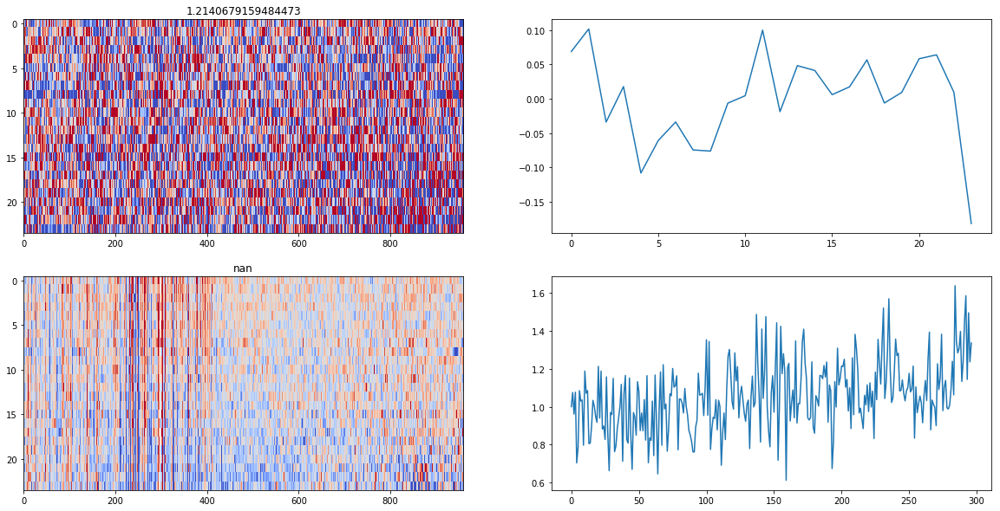

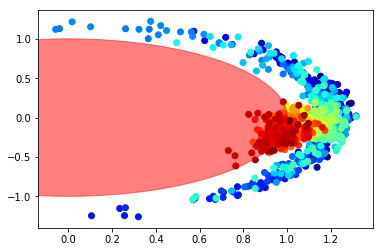

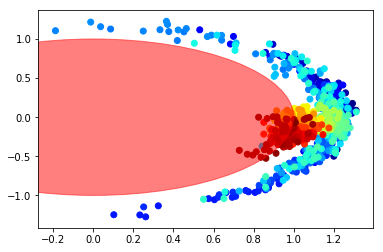

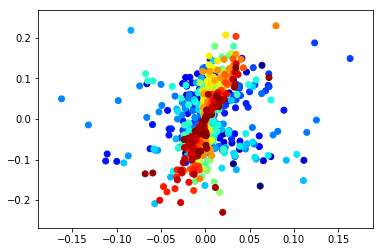

1


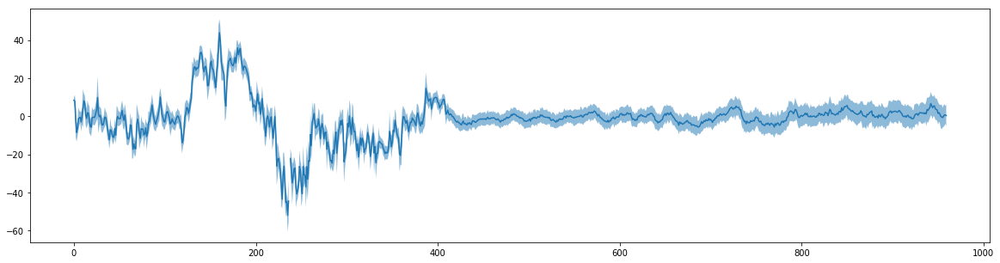

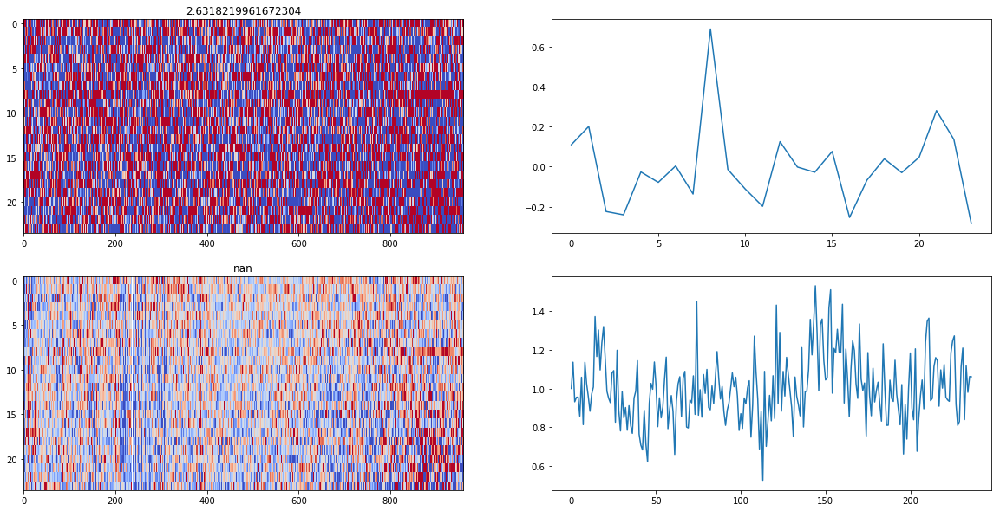

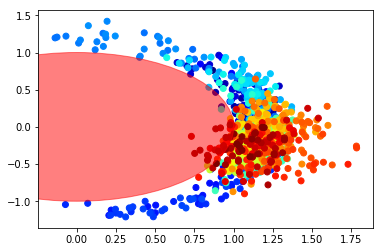

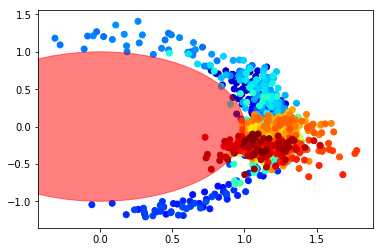

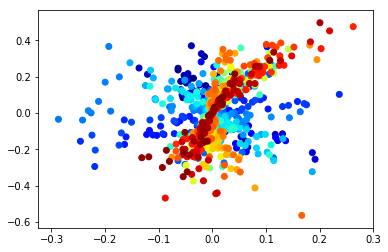

2


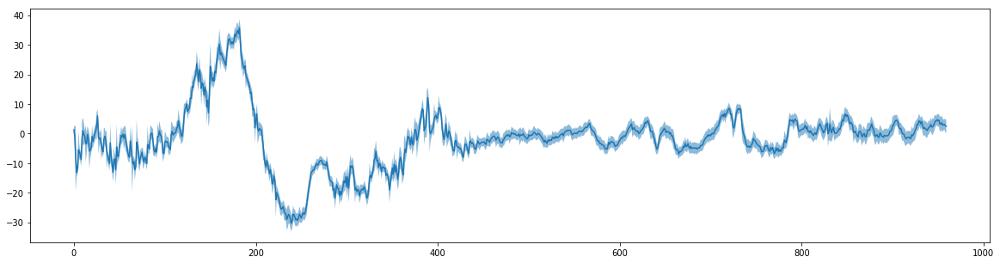

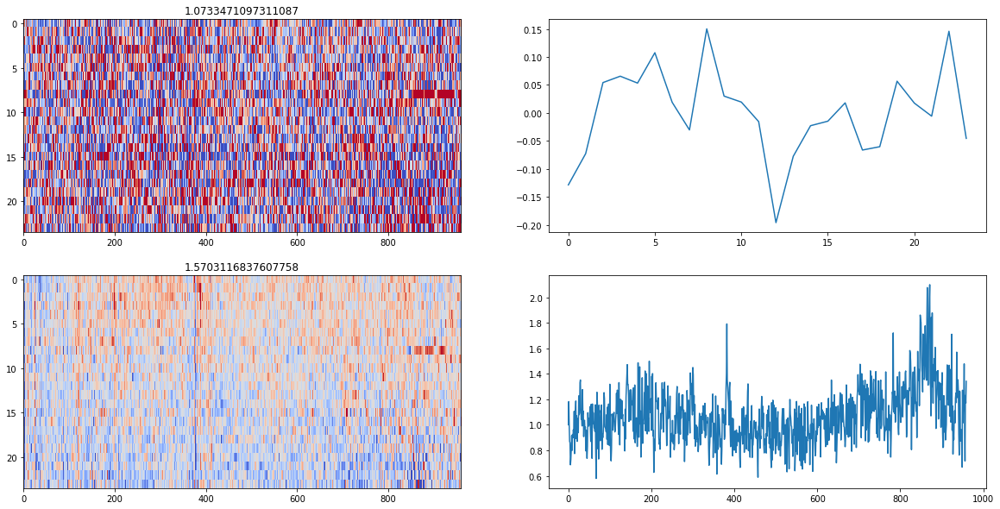

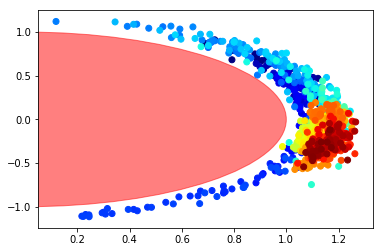

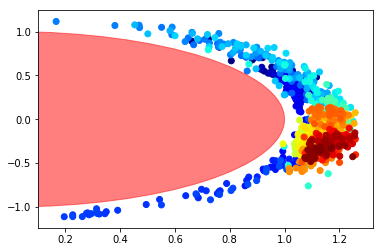

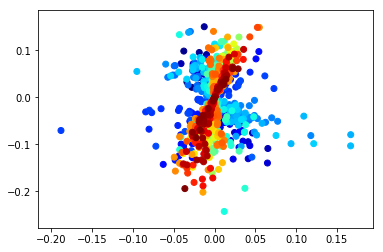

3


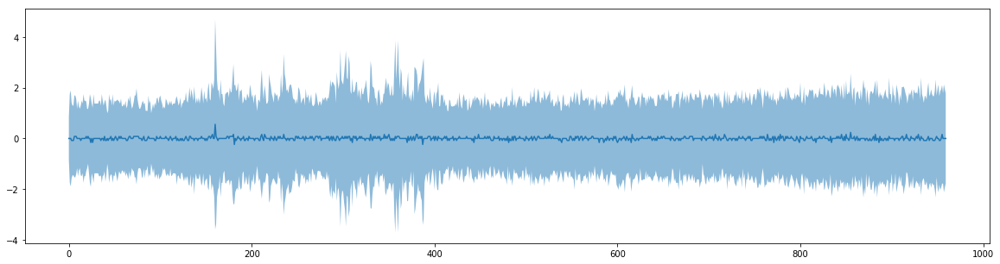

/net/lofar1/data1/albert/miniconda3/envs/bayes_filter/lib/python3.6/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide


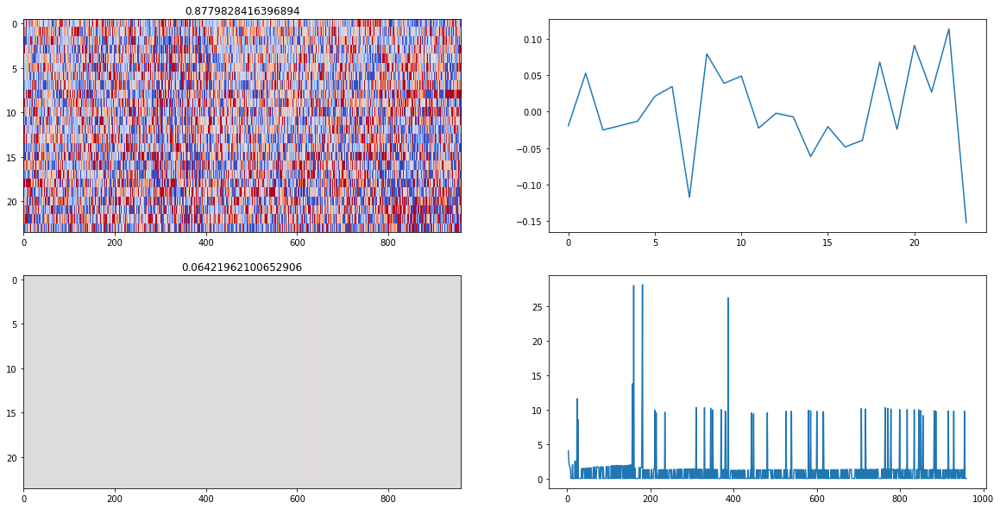

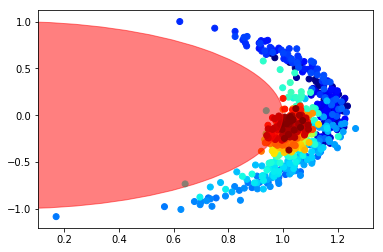

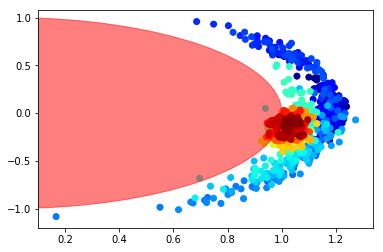

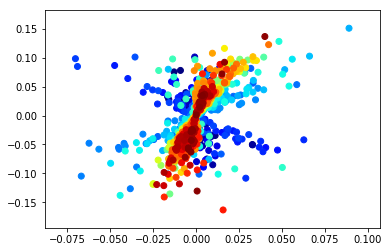

4


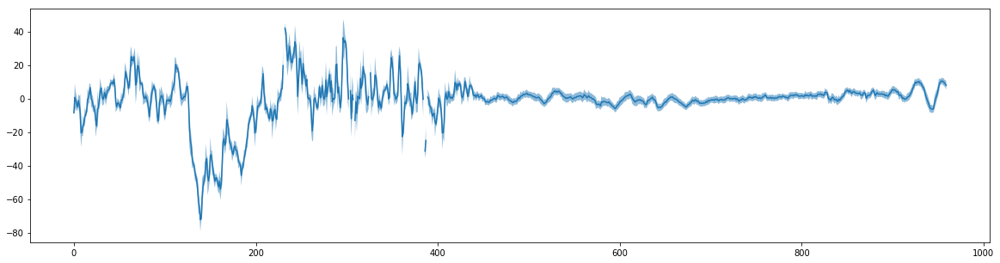

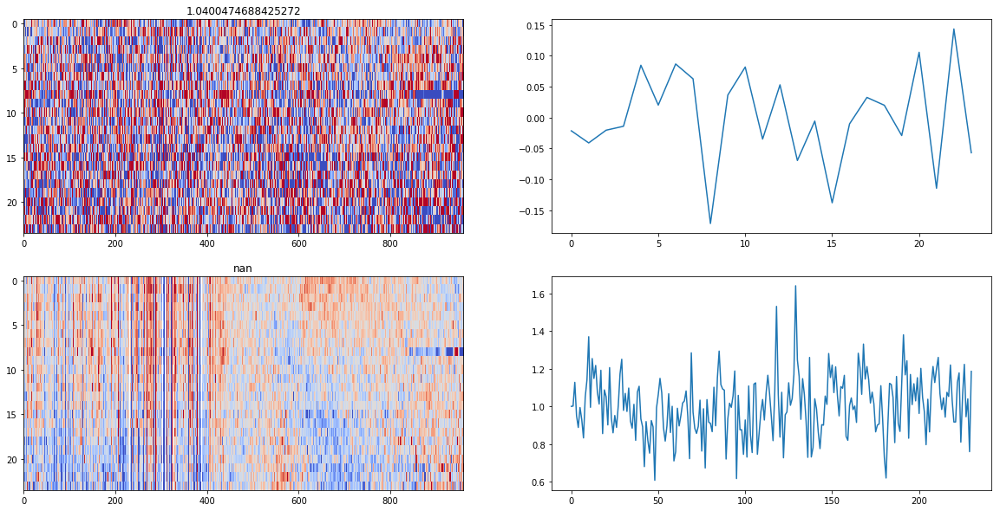

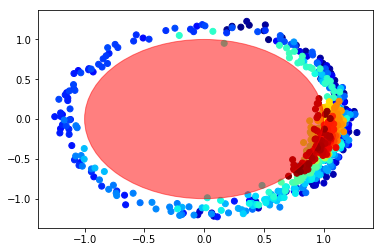

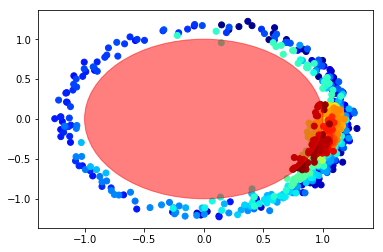

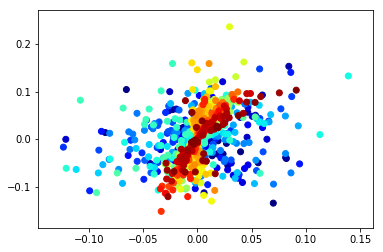

5


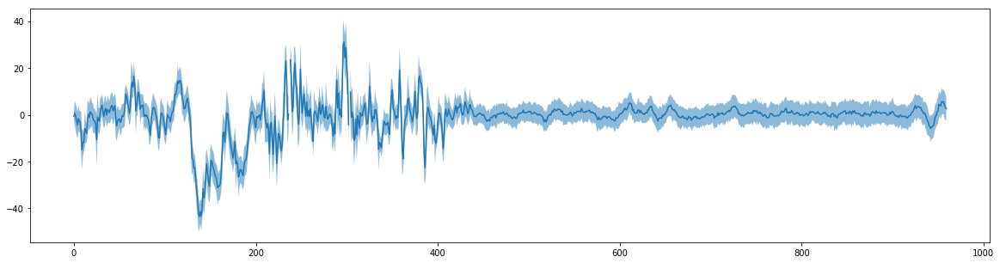

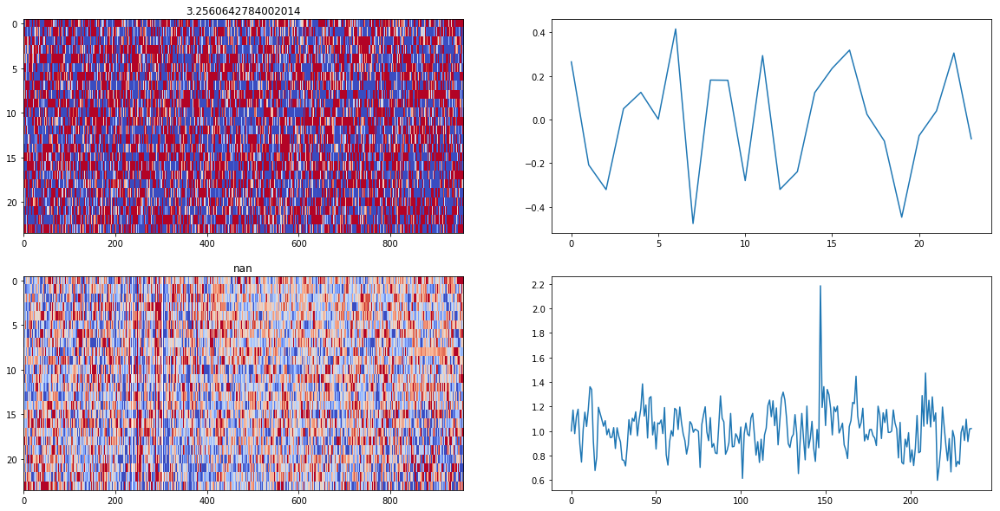

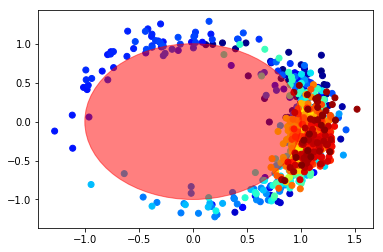

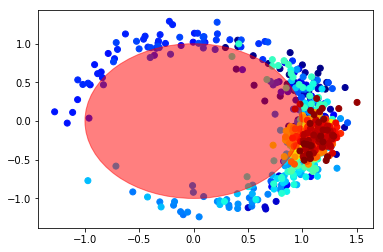

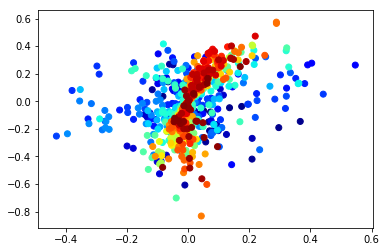

6


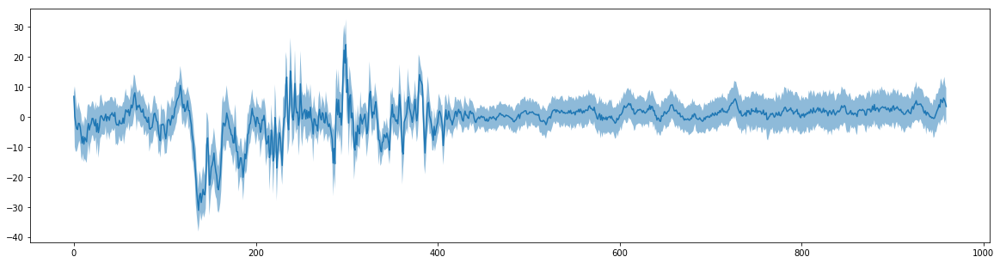

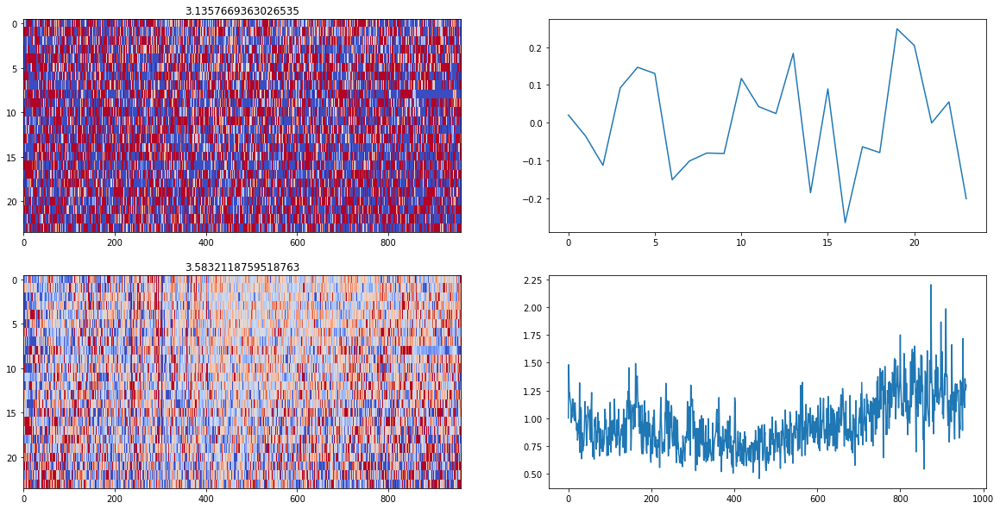

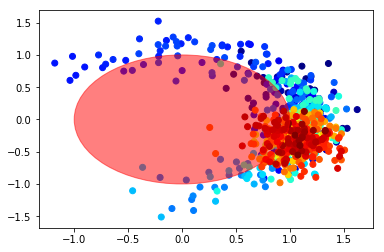

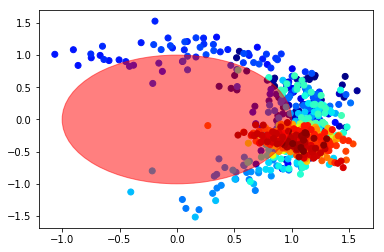

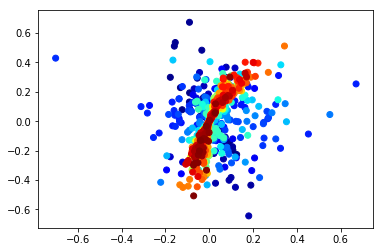

7


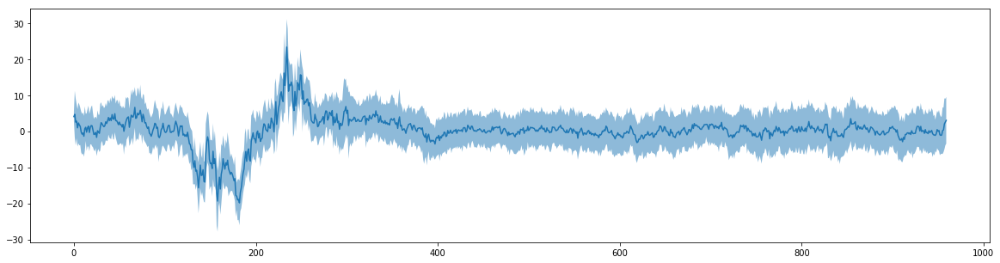

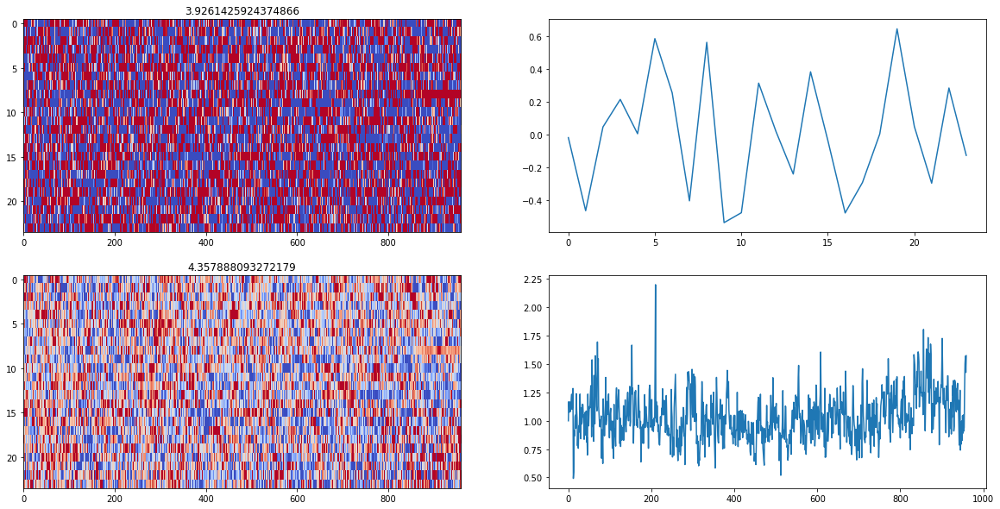

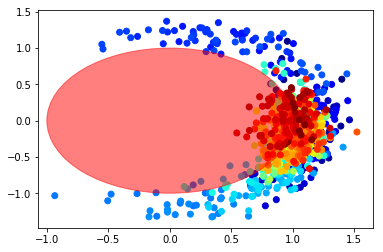

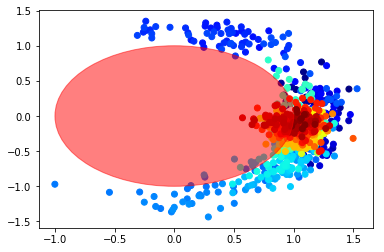

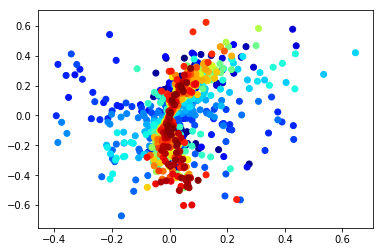

8


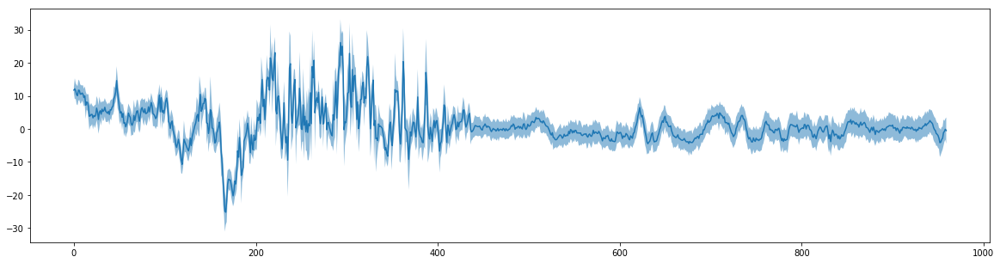

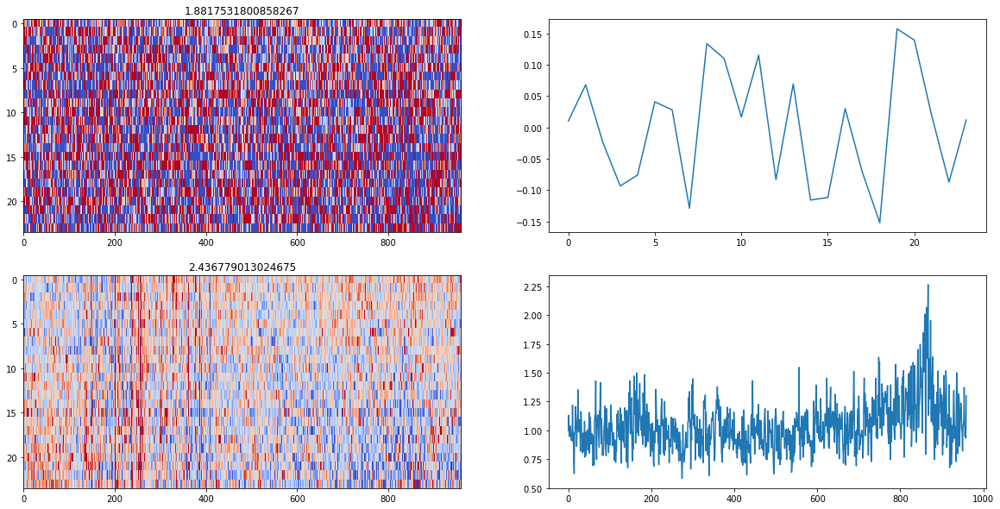

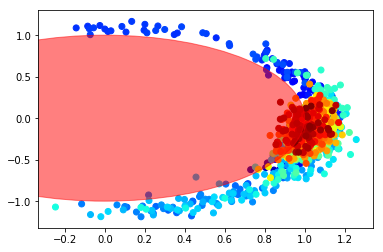

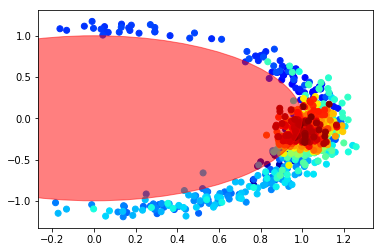

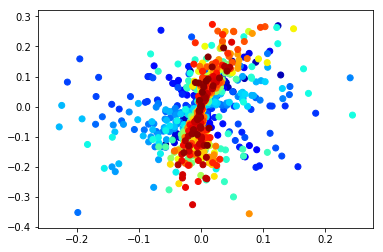

9


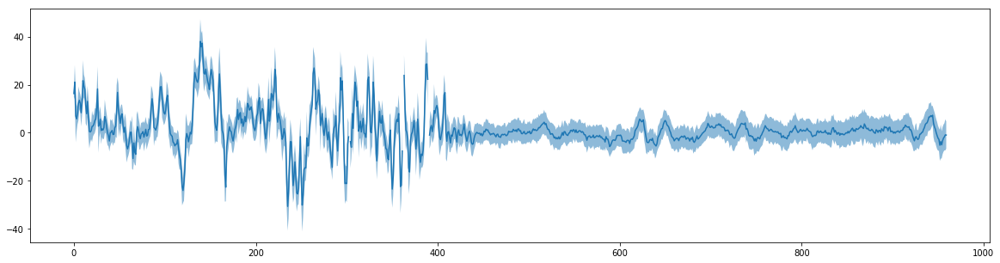

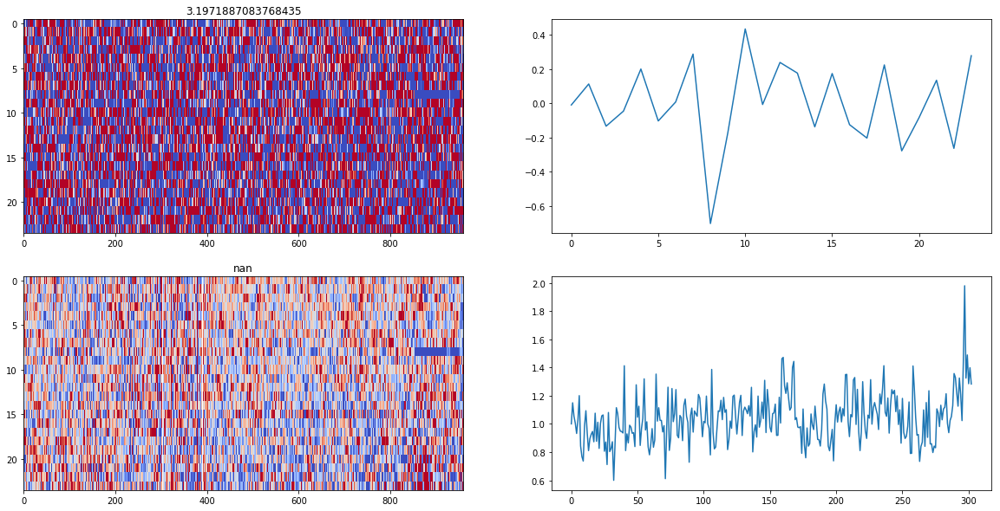

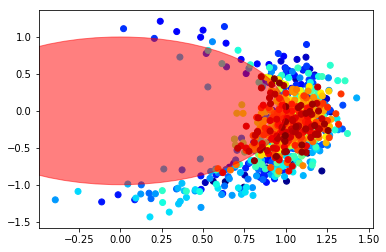

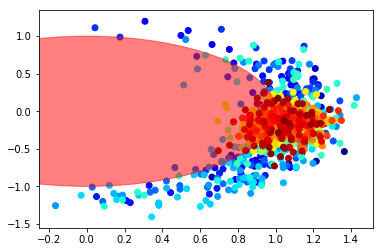

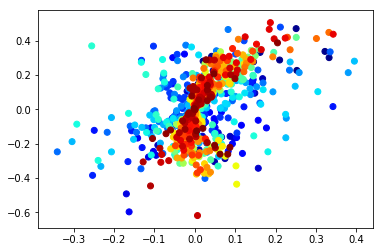

10


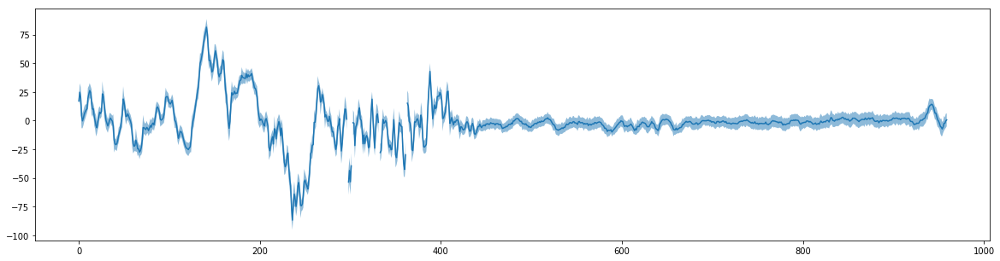

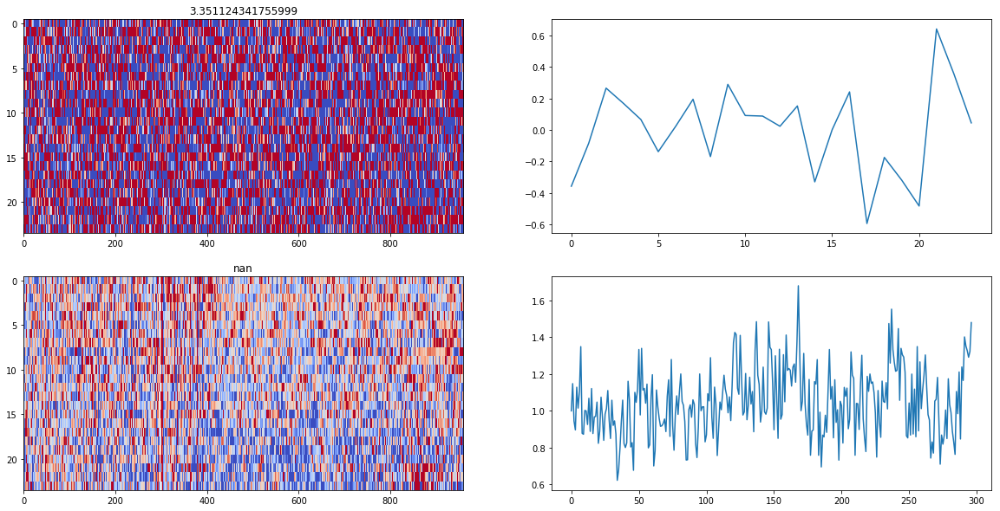

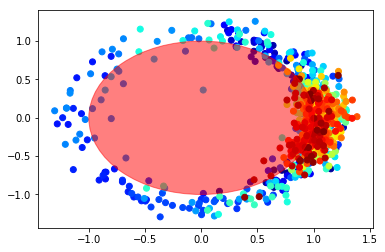

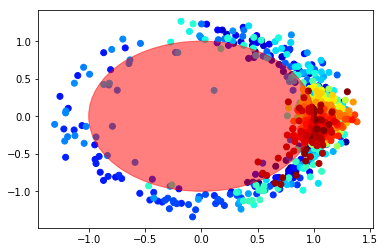

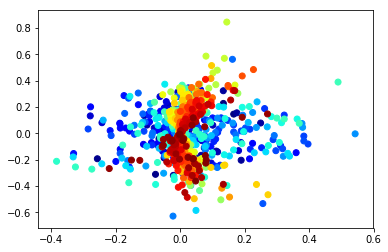

11


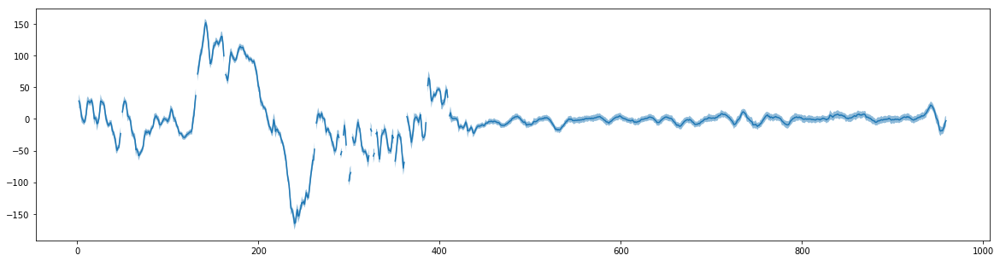

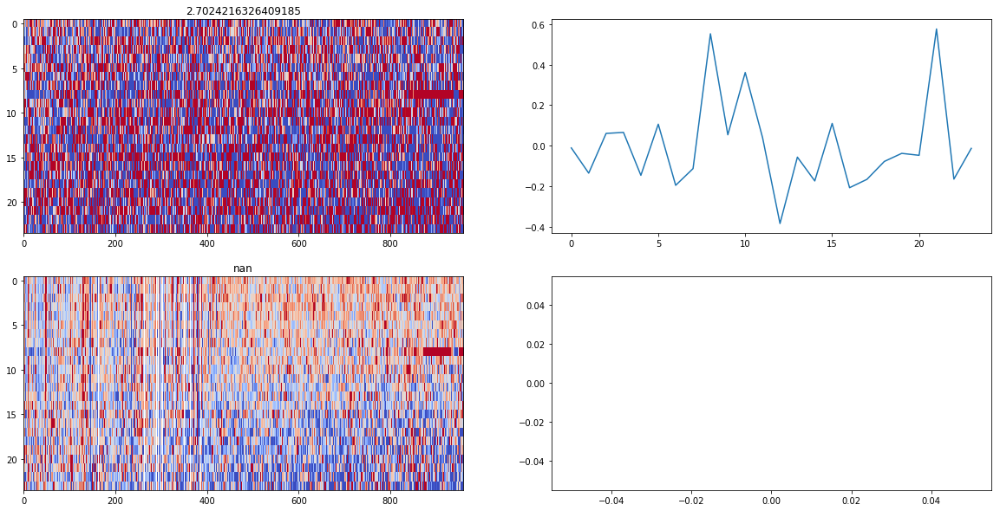

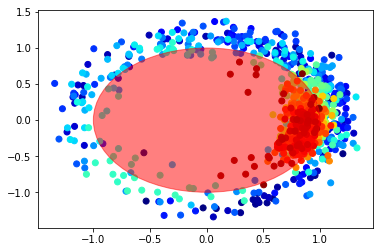

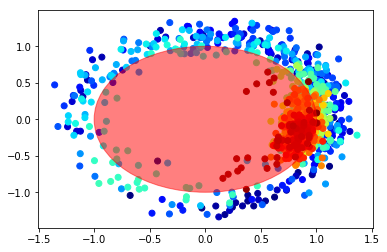

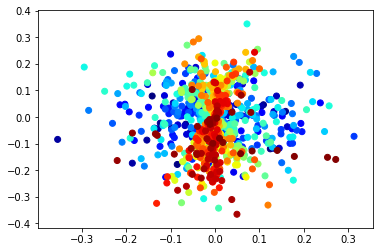

12


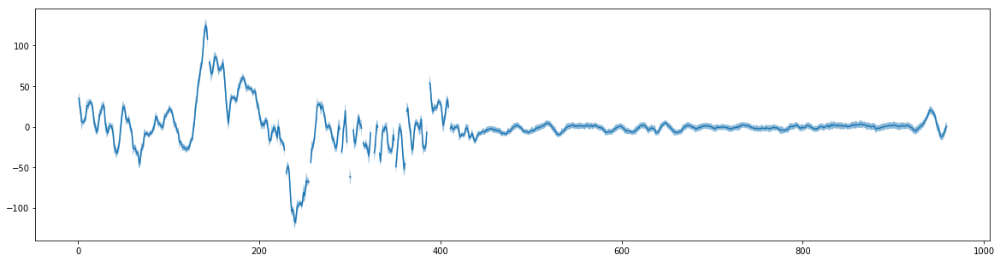

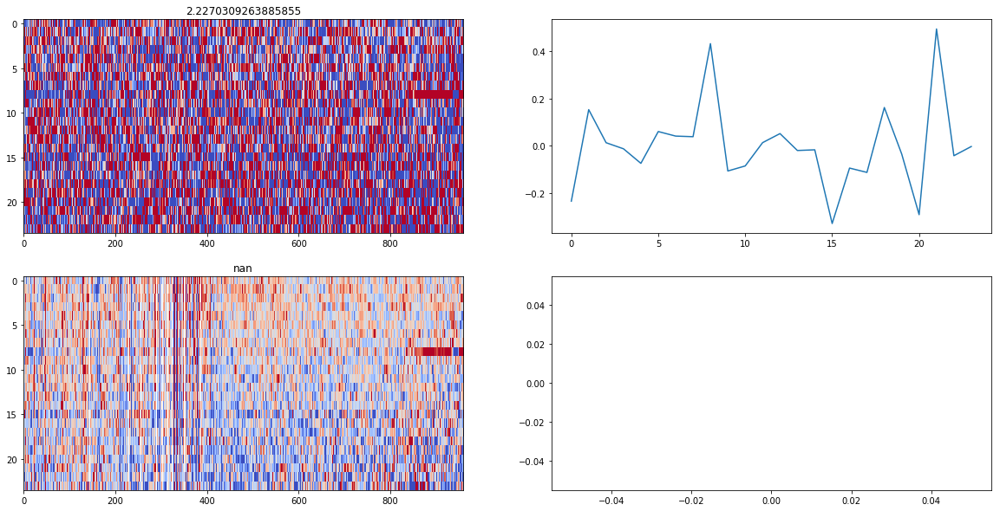

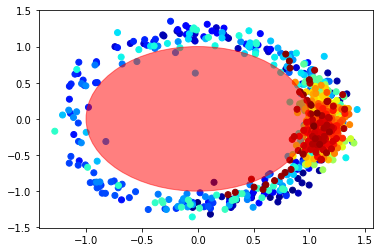

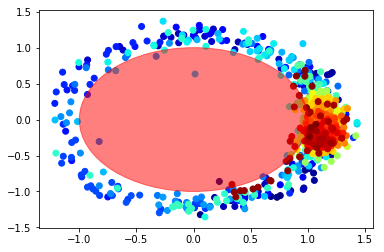

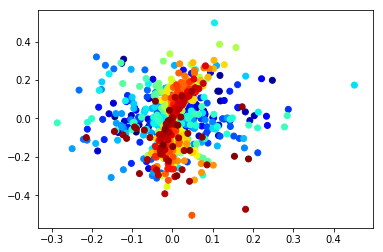

13


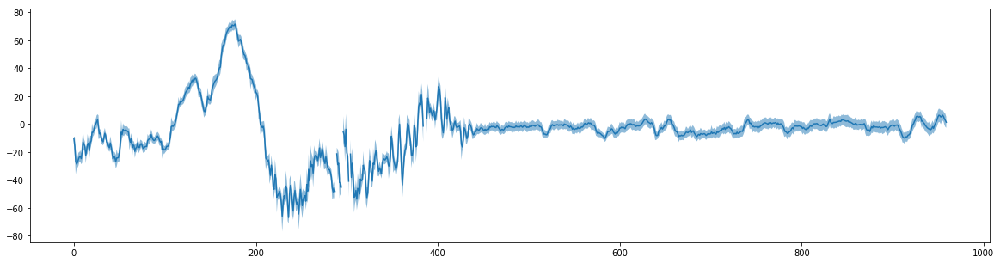

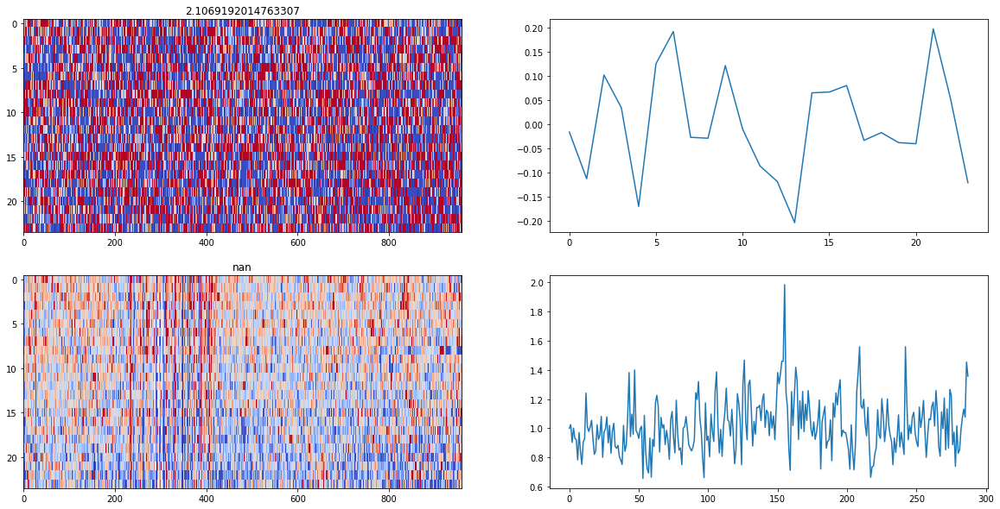

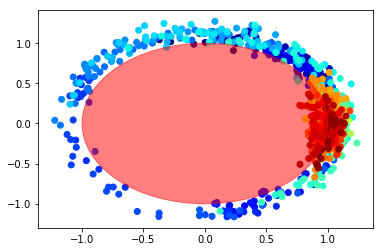

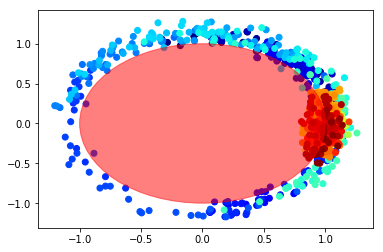

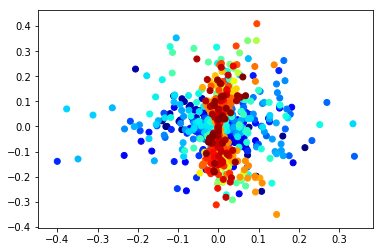

14


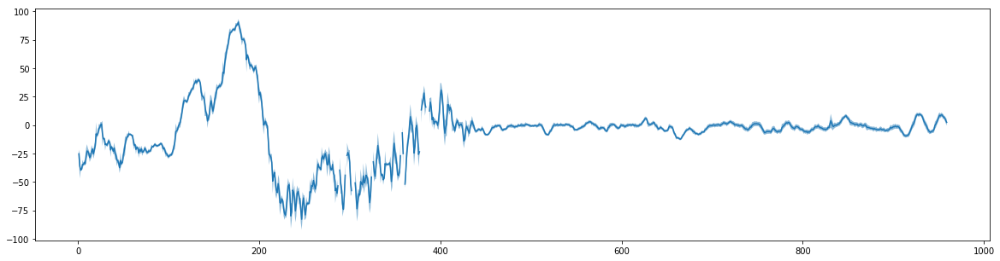

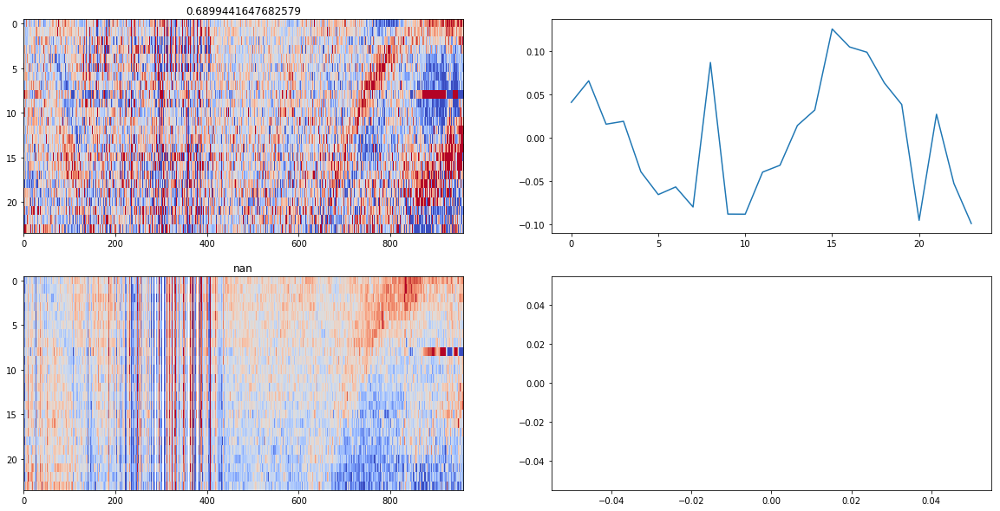

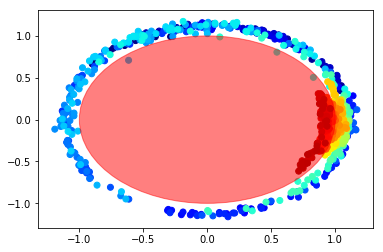

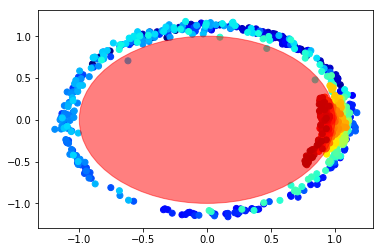

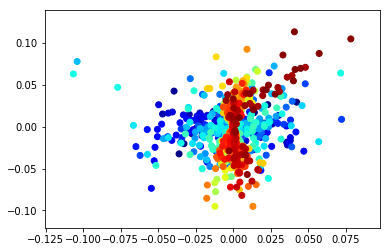

15


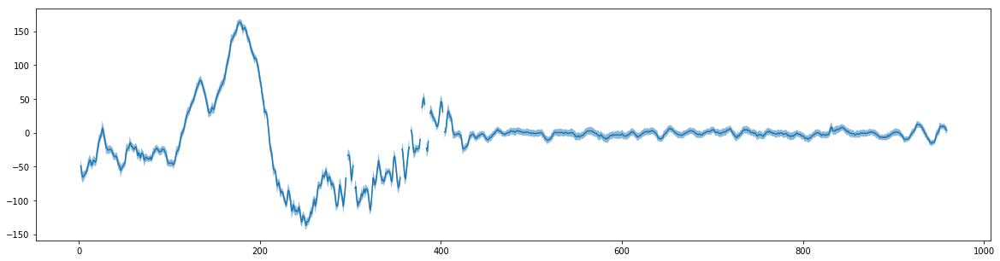

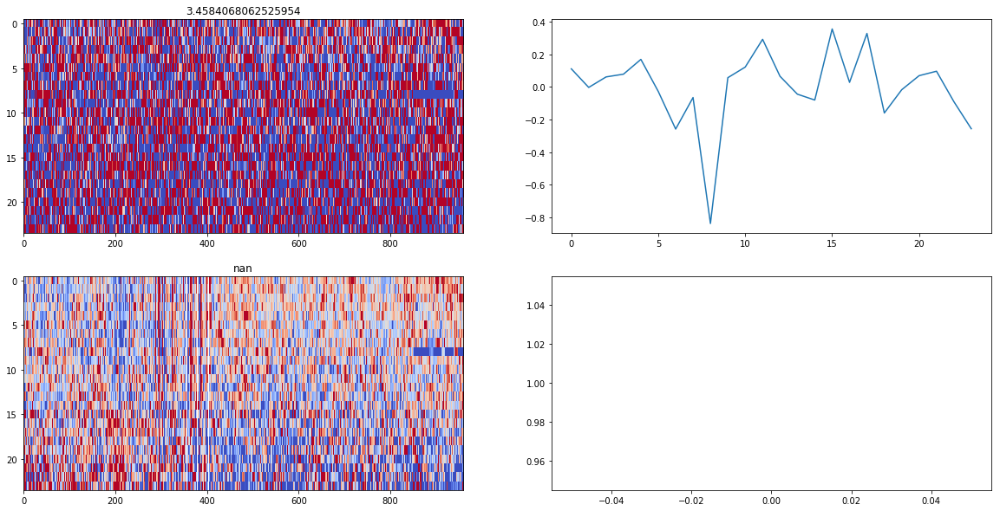

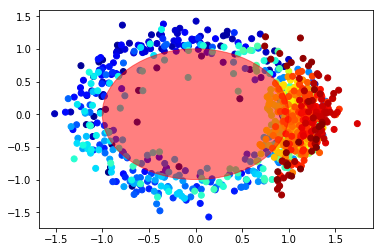

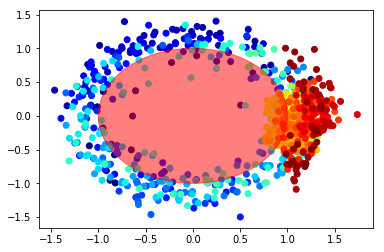

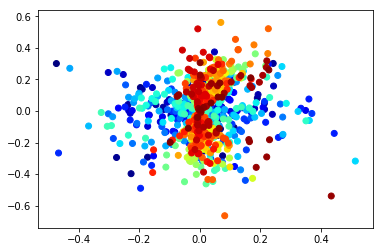

16


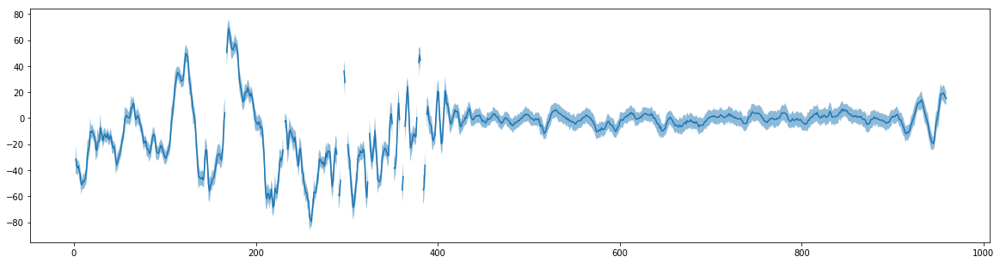

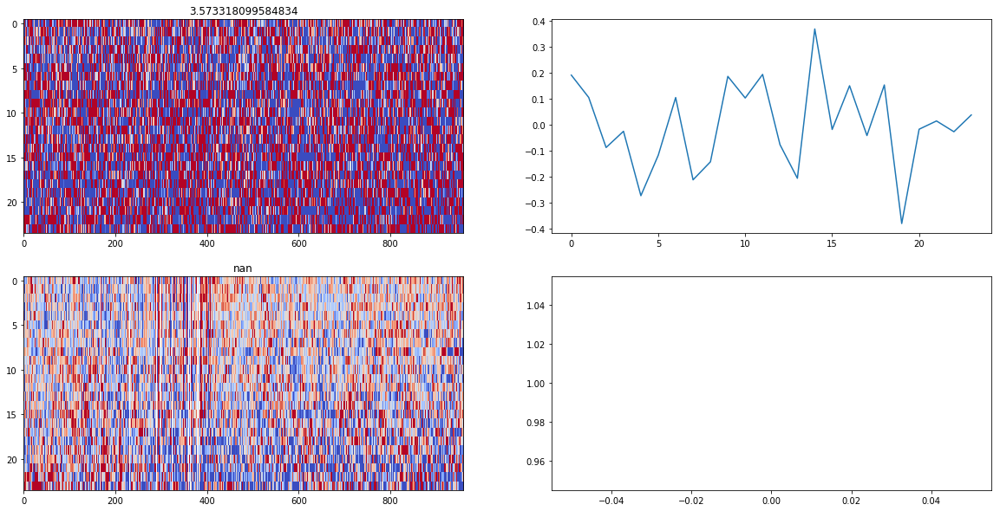

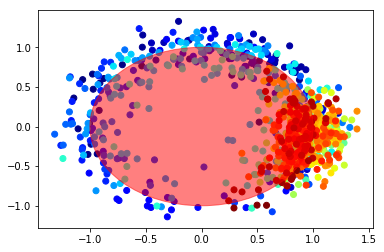

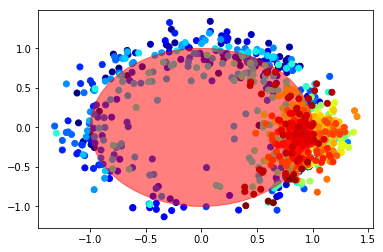

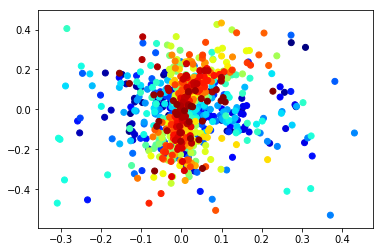

17


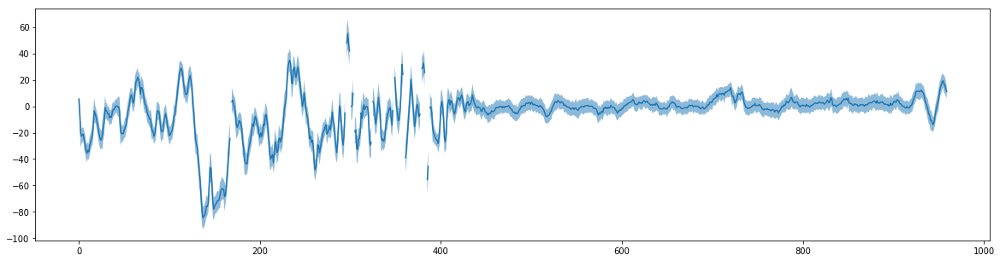

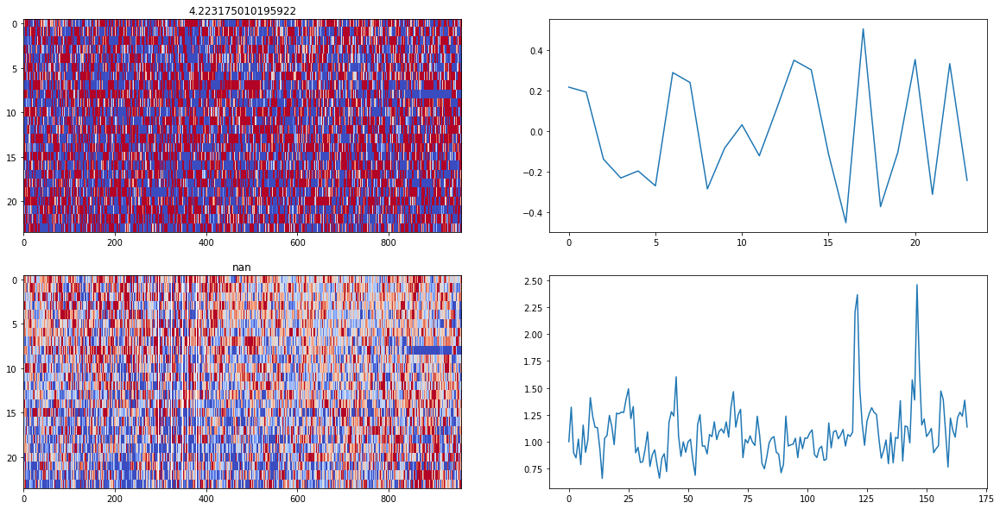

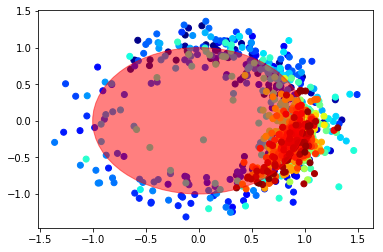

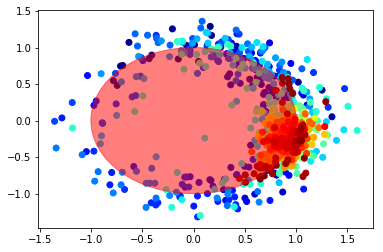

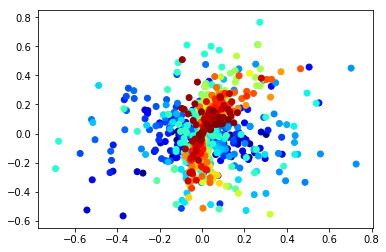

18


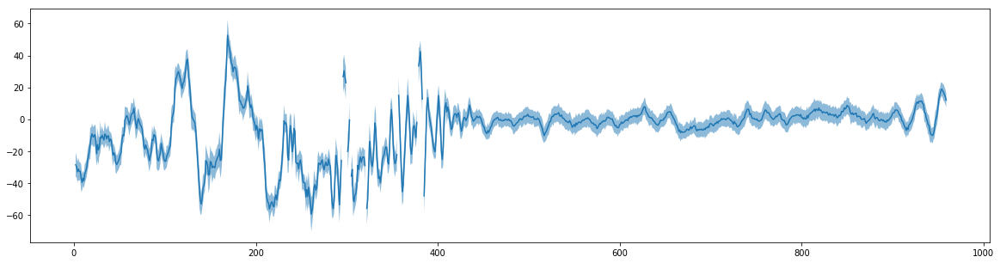

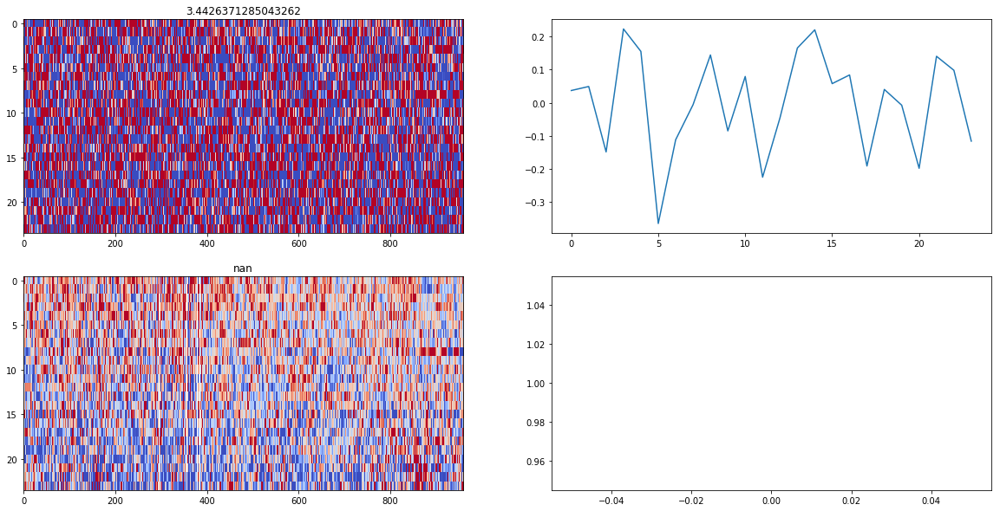

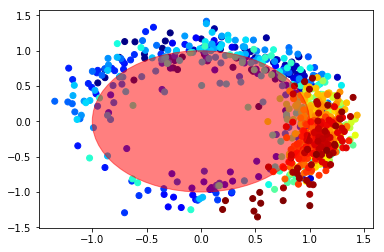

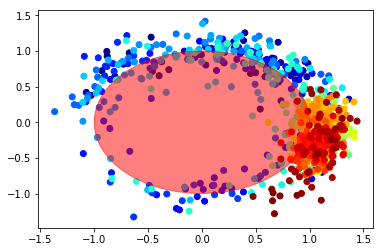

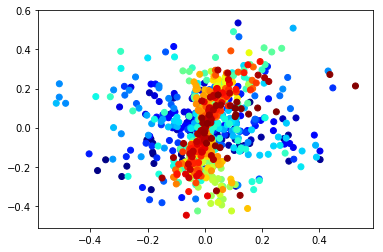

19


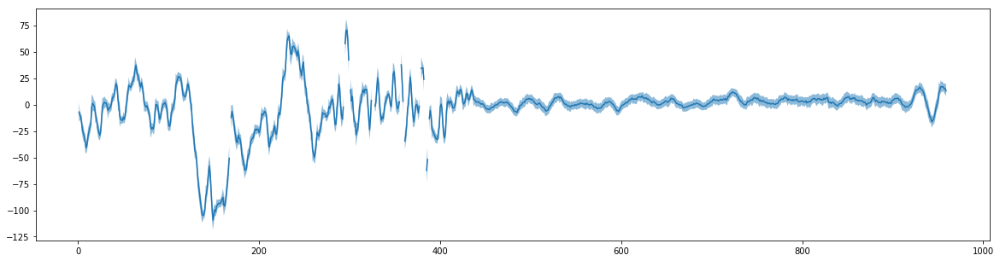

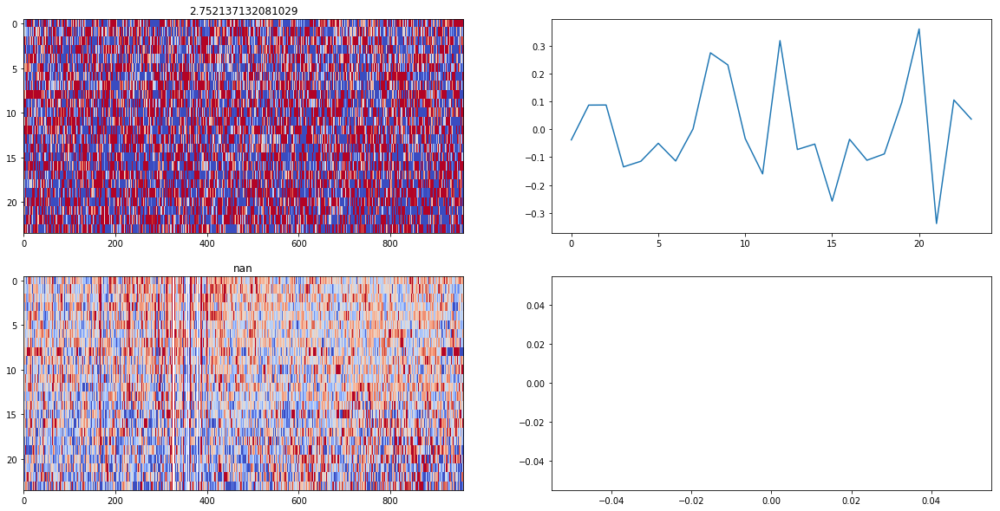

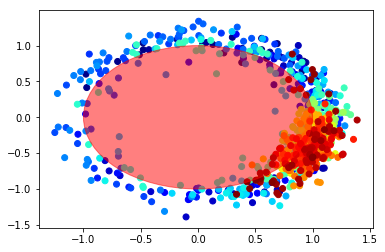

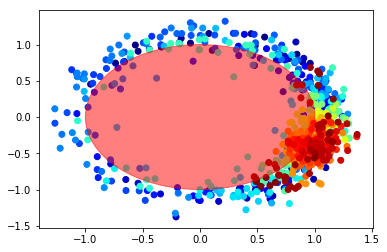

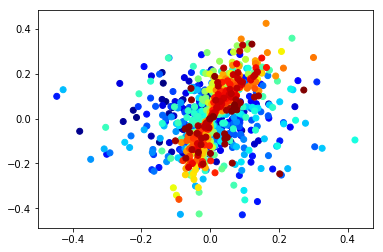

20


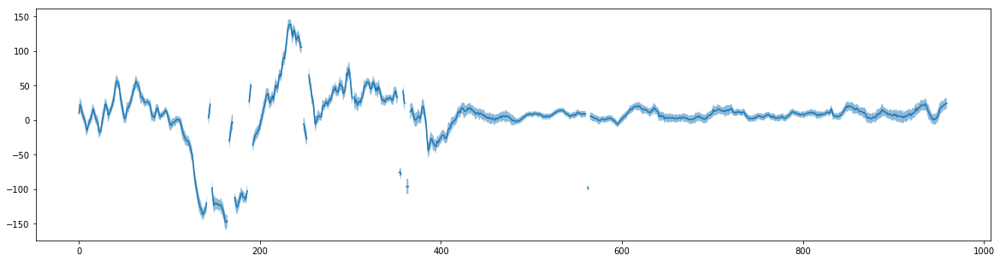

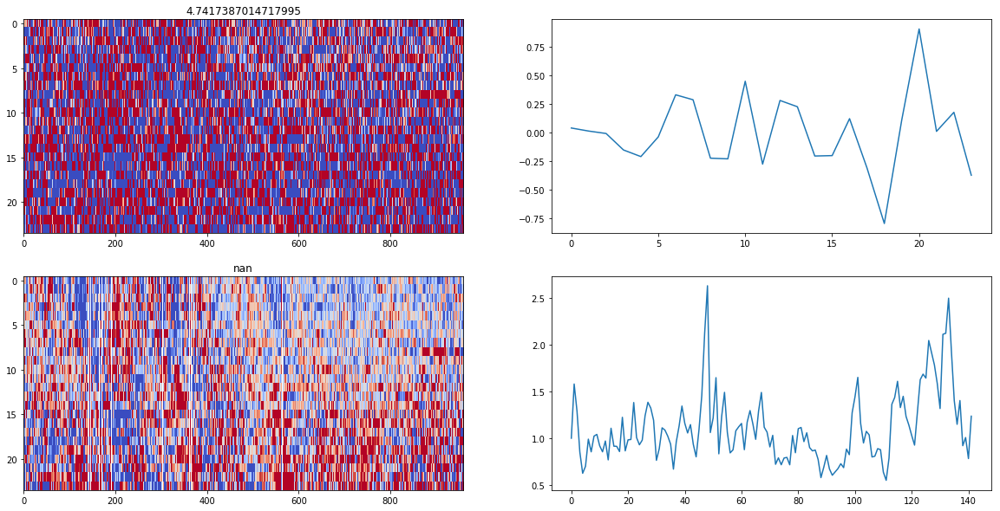

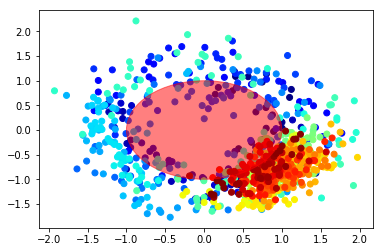

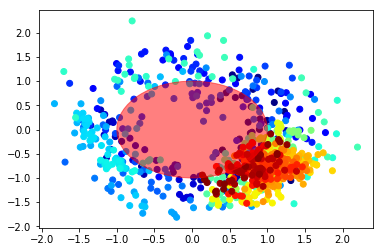

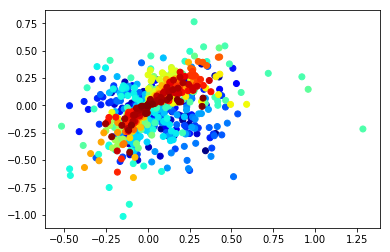

21


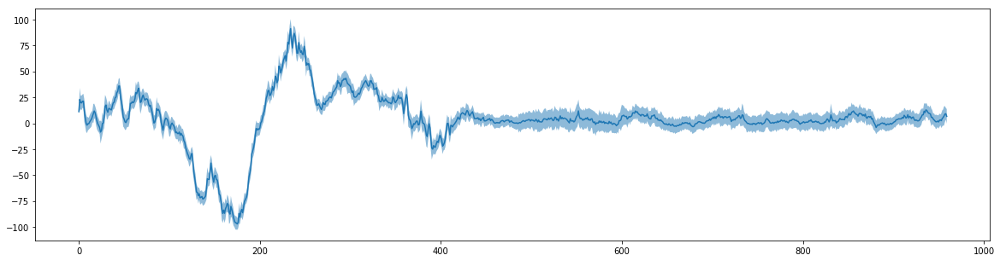

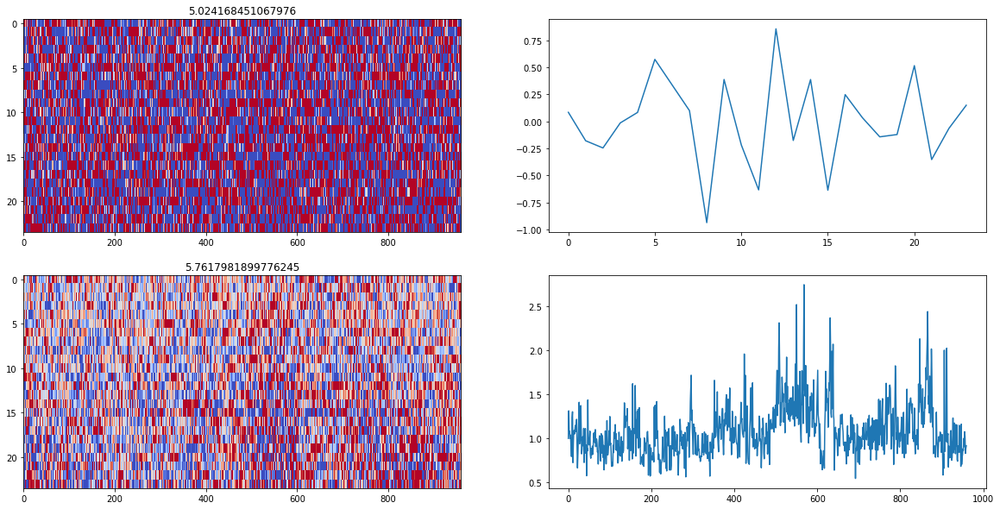

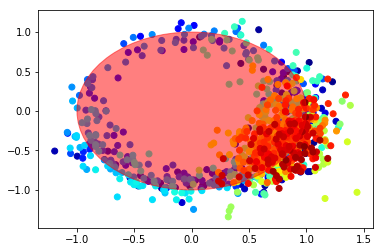

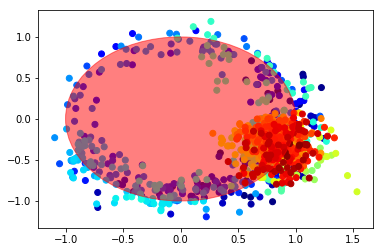

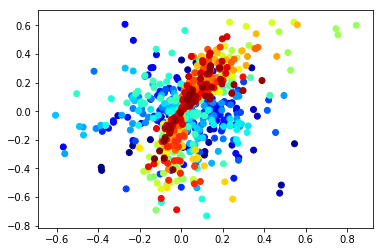

22


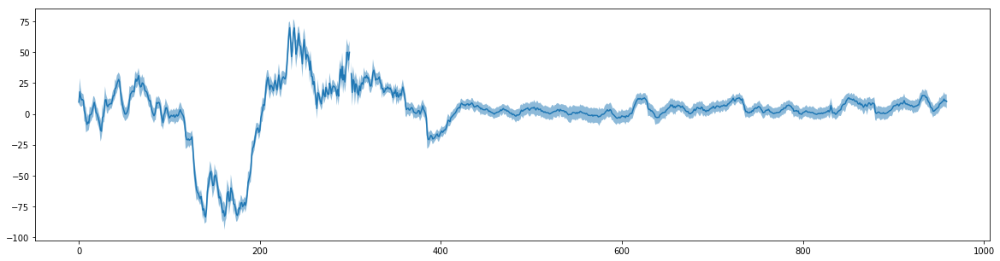

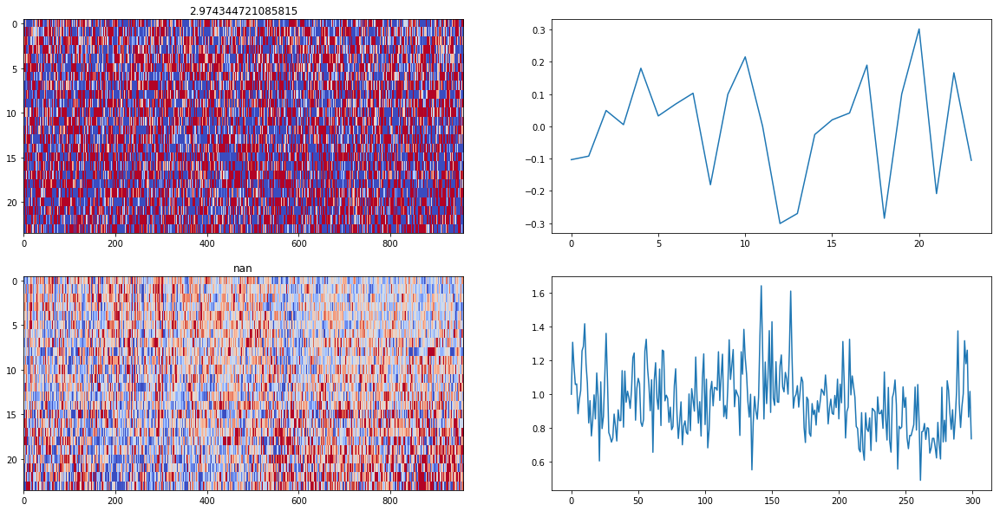

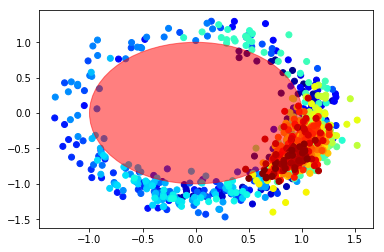

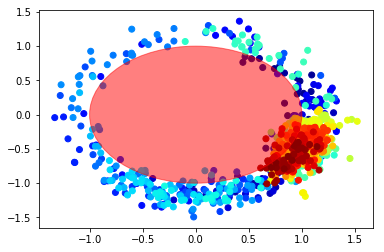

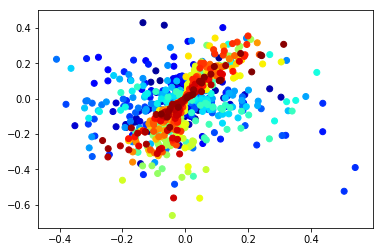

23


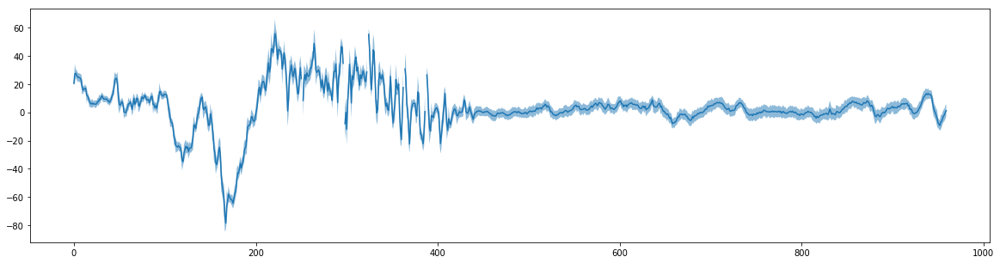

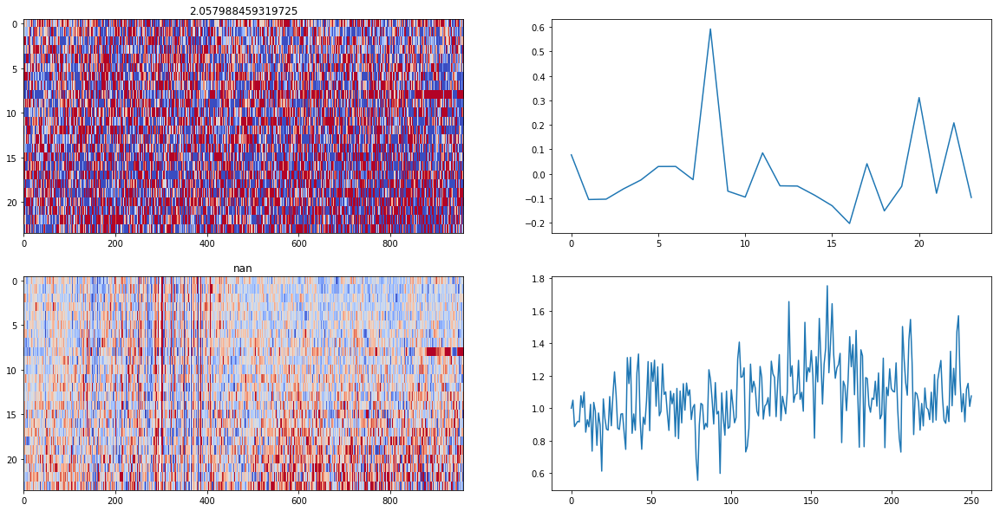

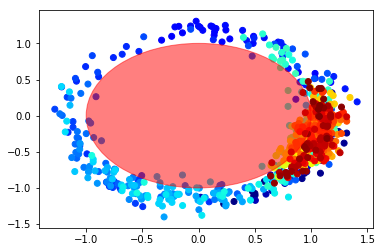

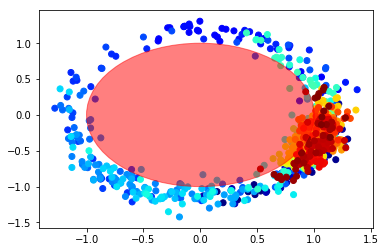

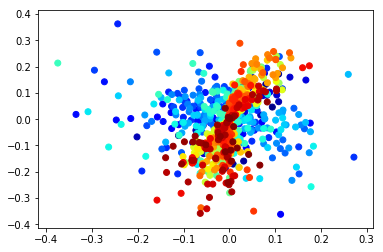

24


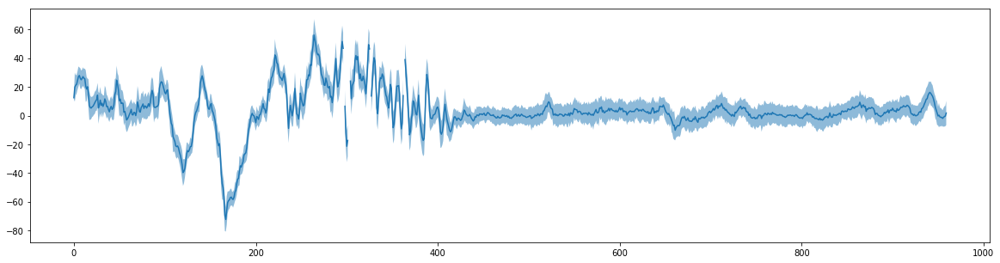

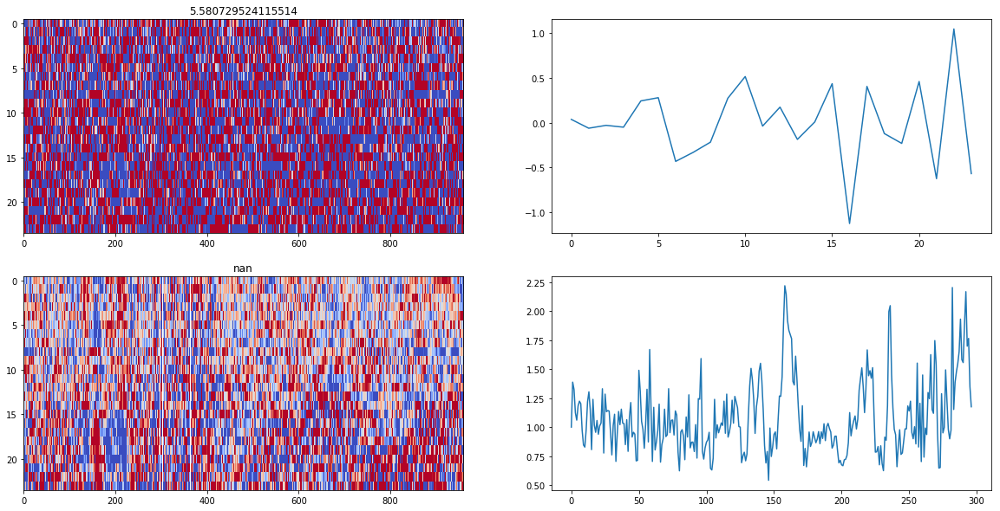

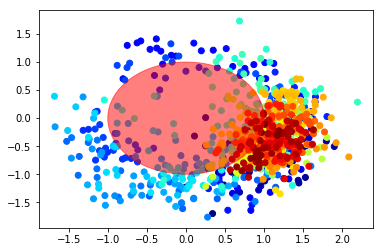

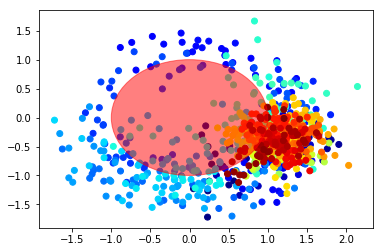

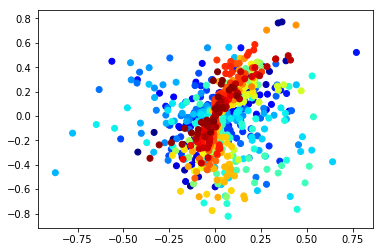

25


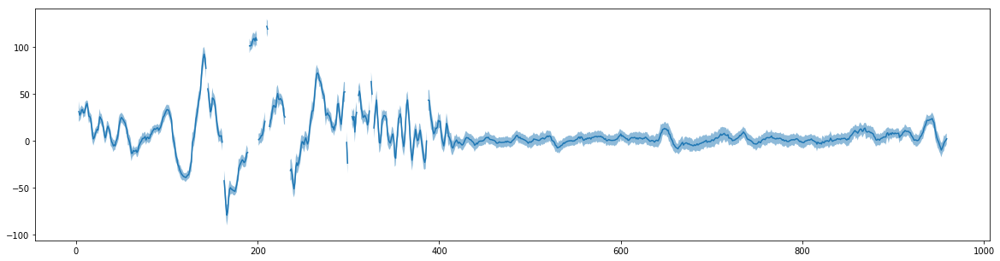

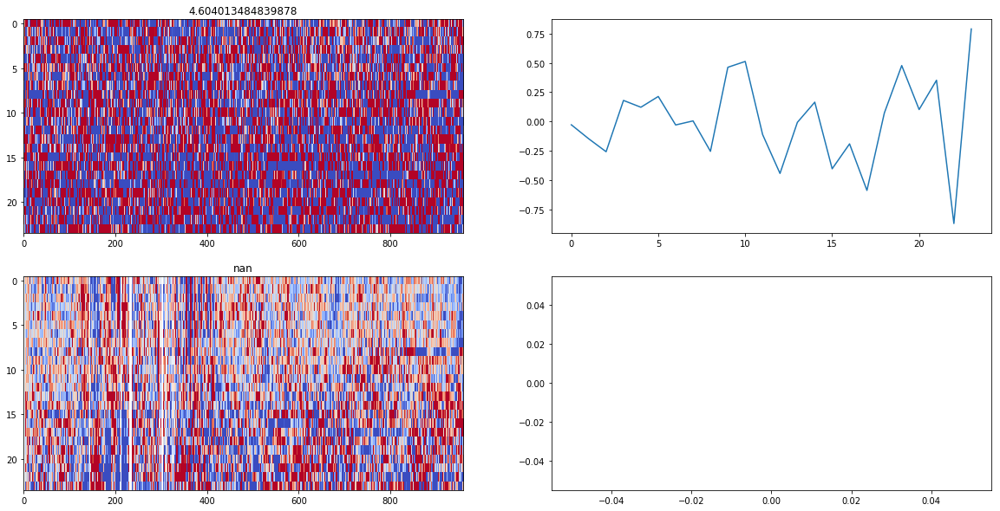

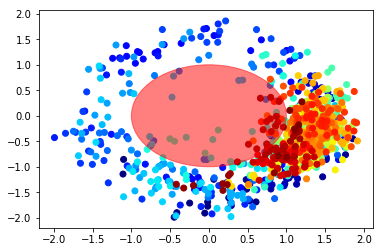

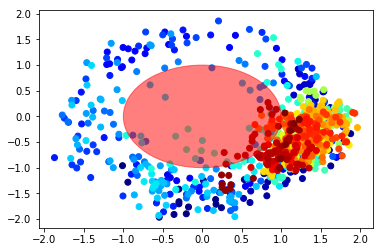

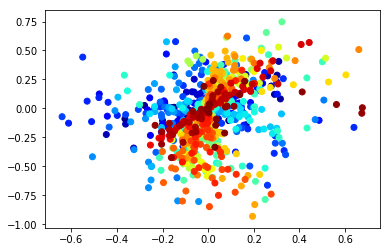

26


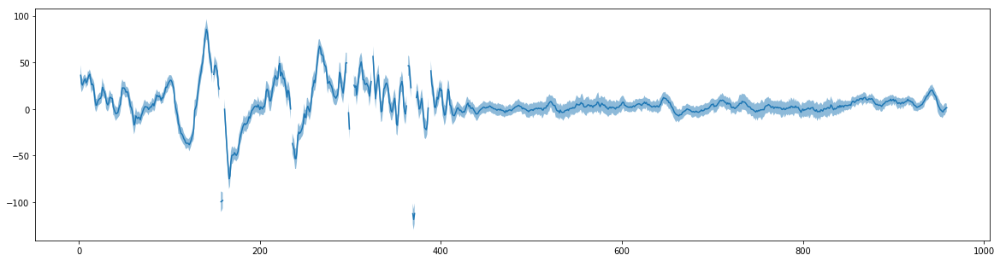

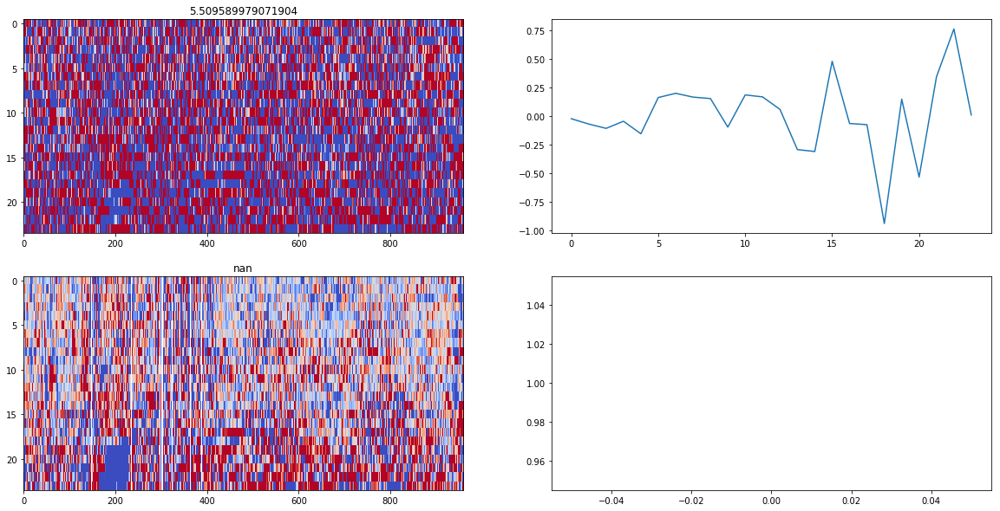

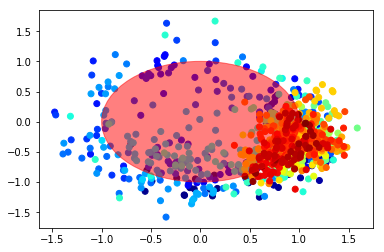

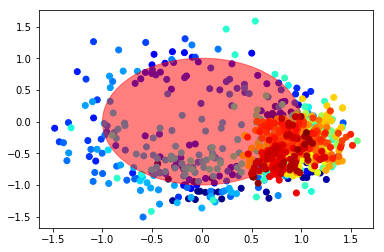

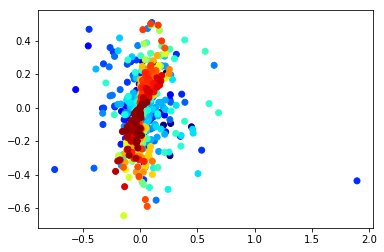

27


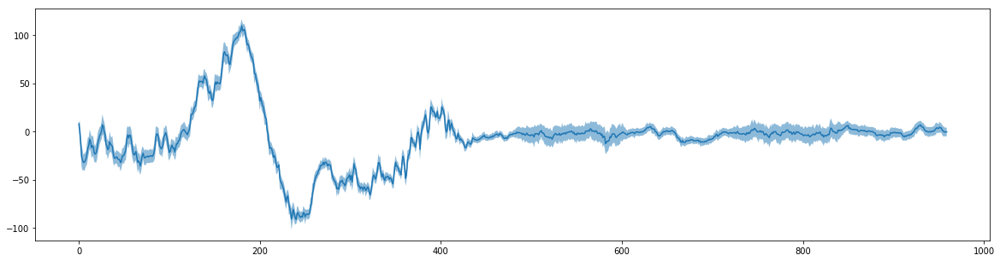

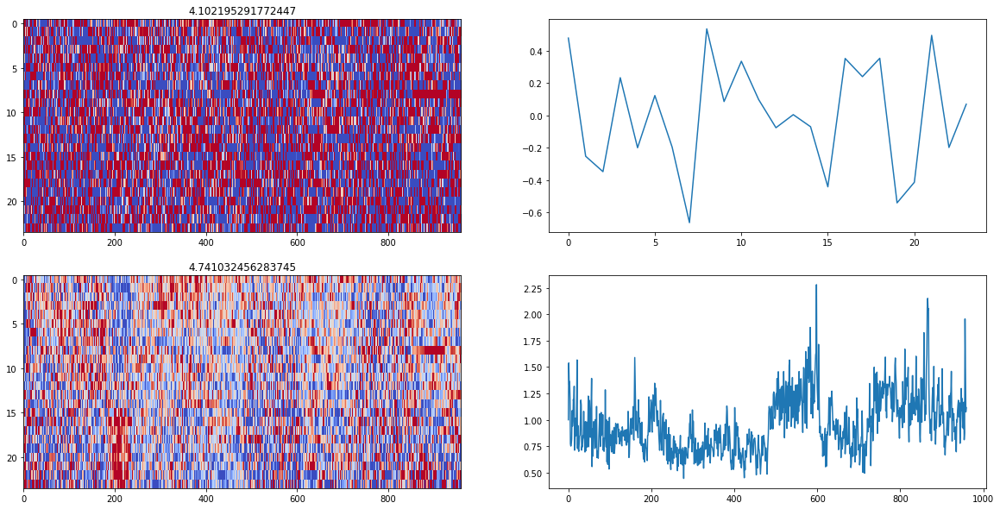

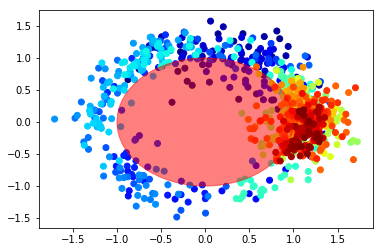

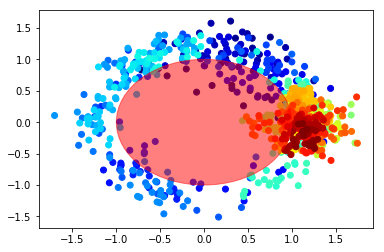

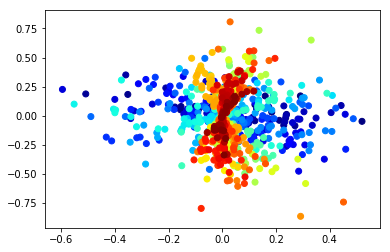

28


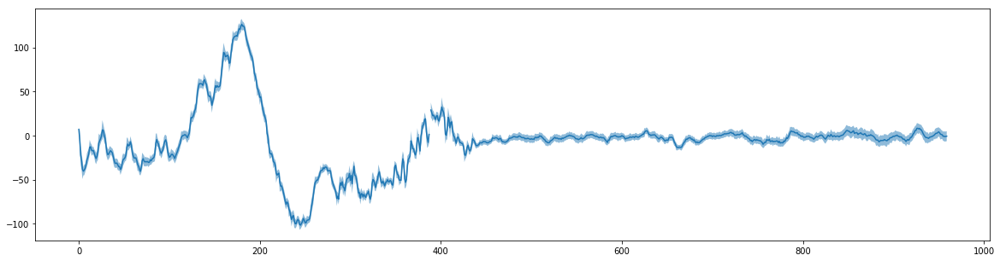

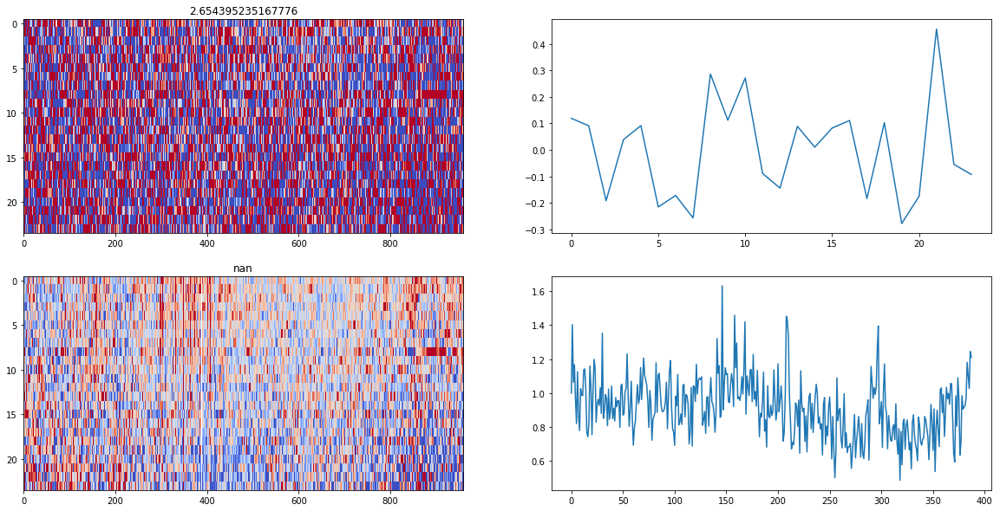

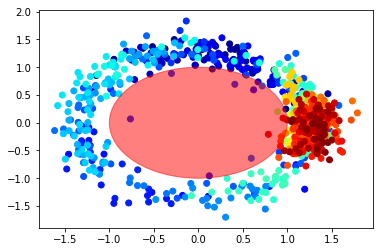

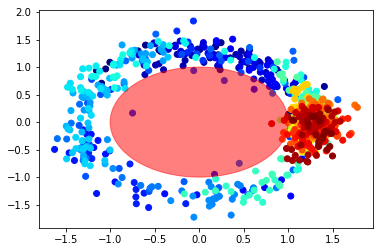

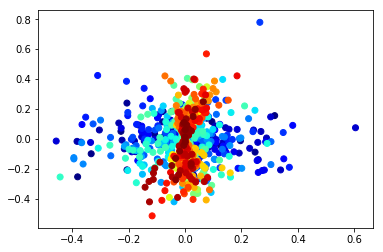

29


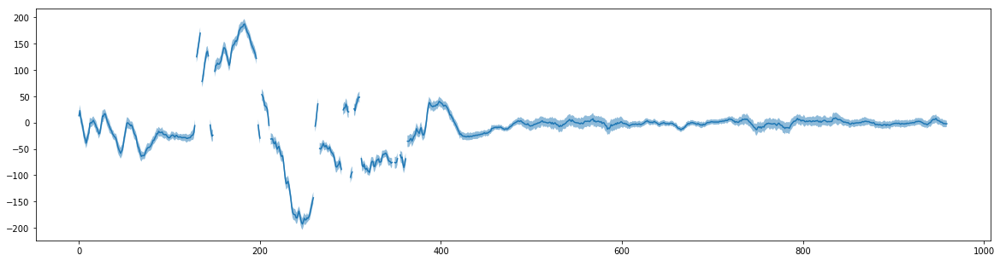

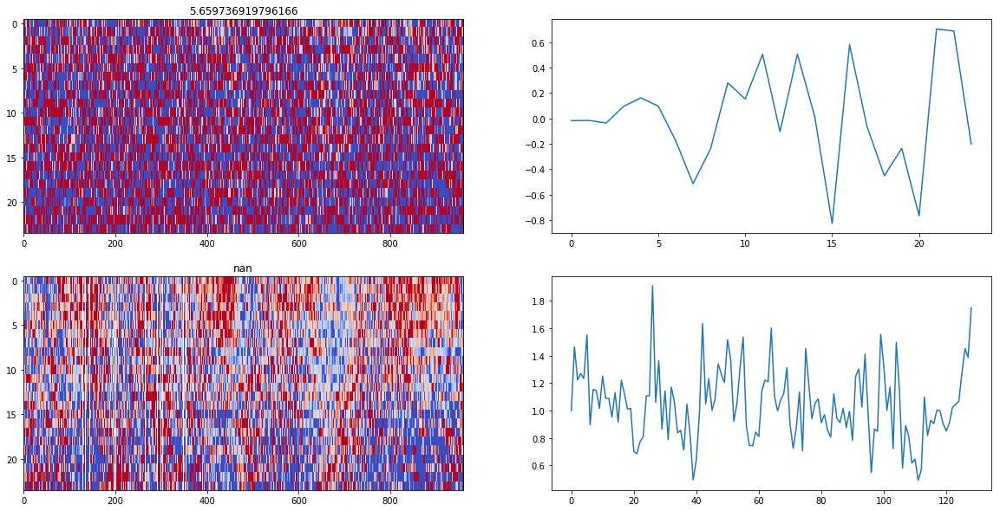

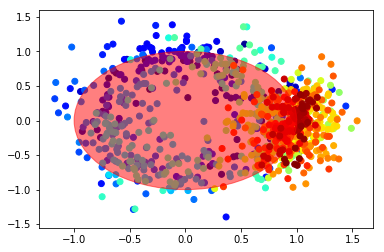

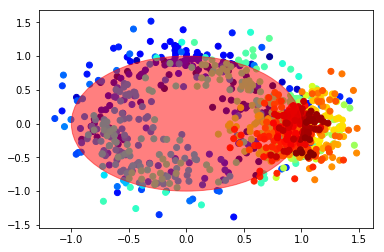

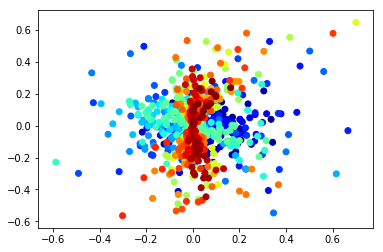

30


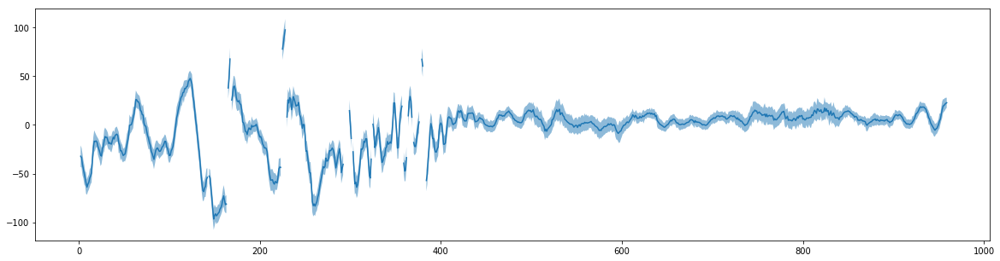

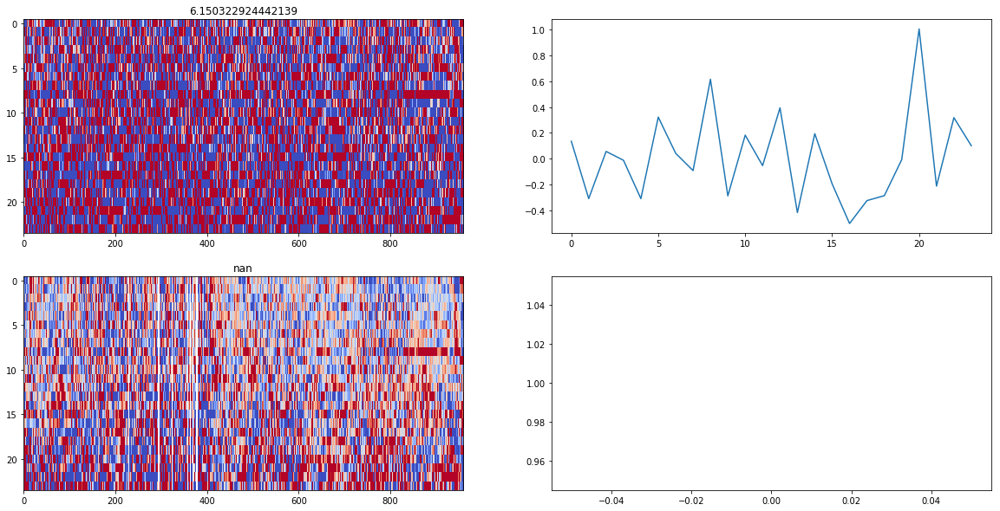

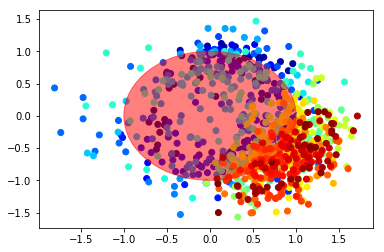

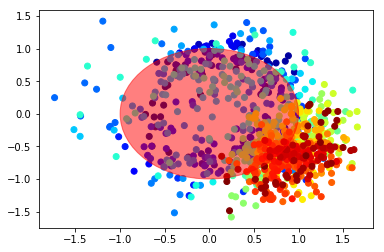

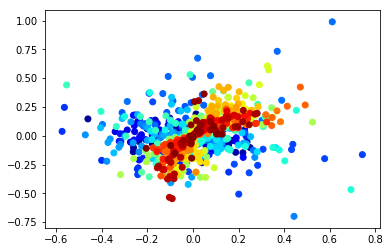

31


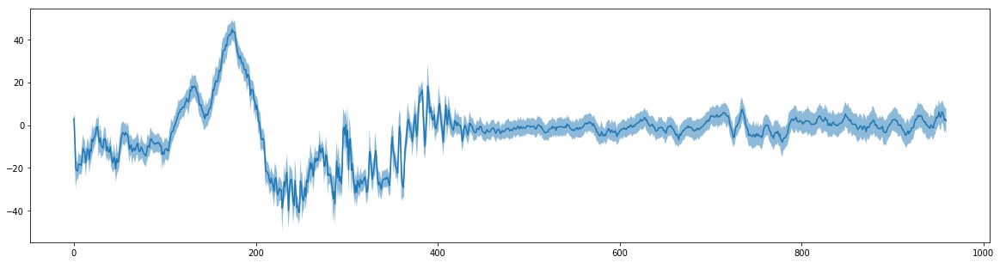

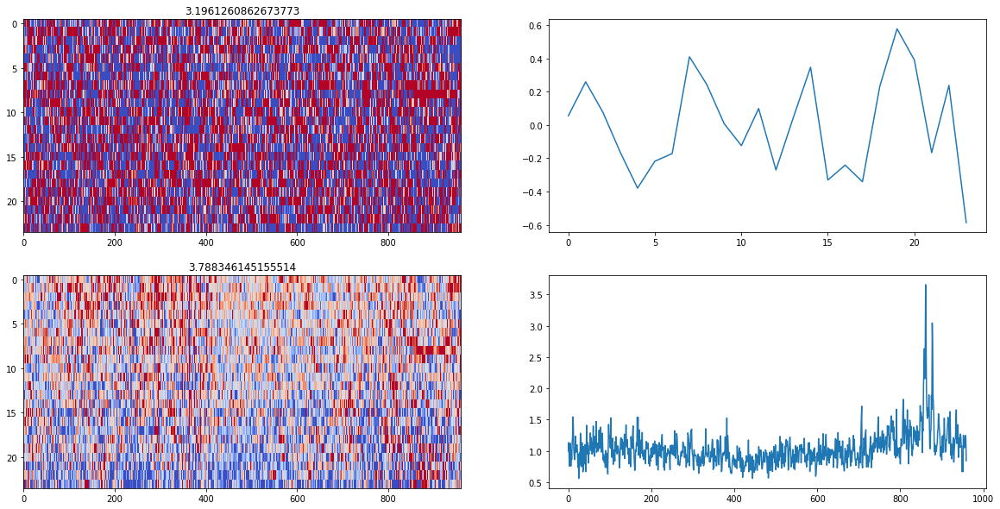

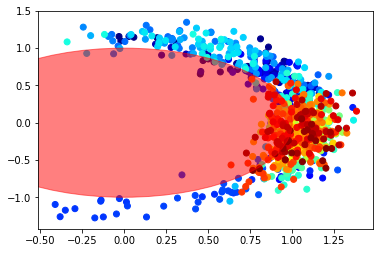

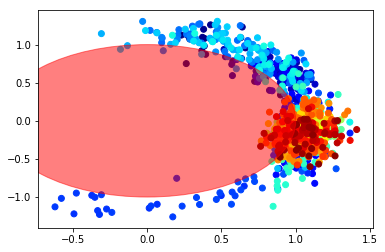

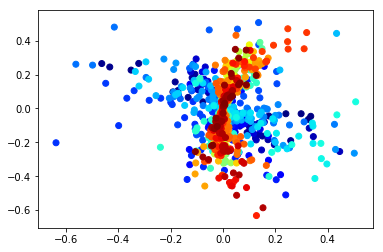

32


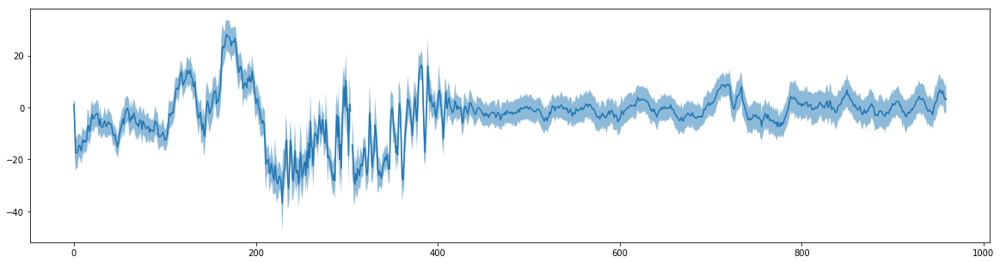

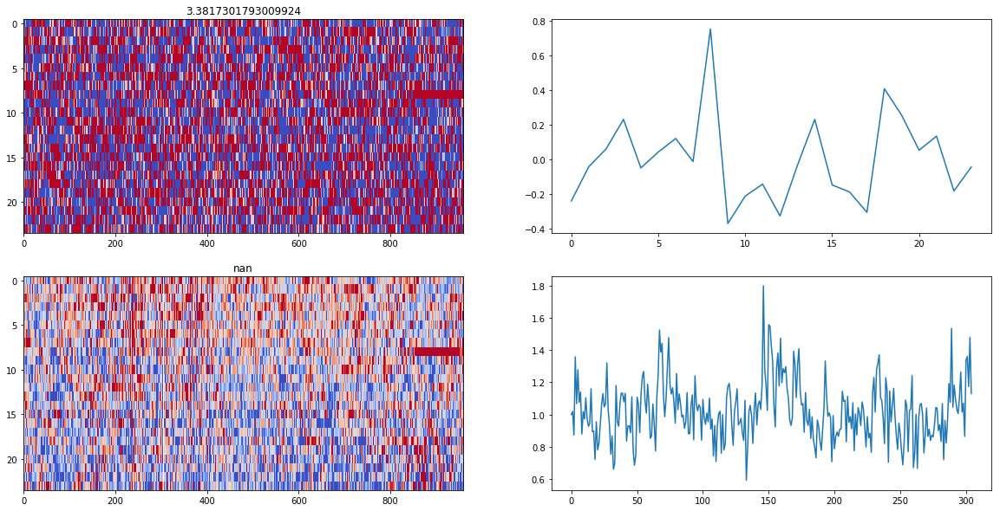

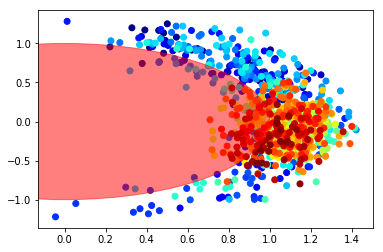

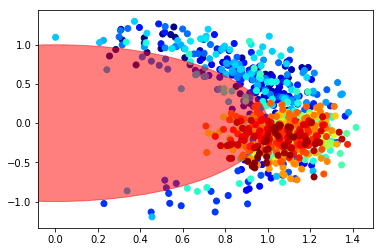

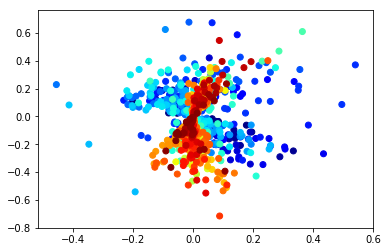

33


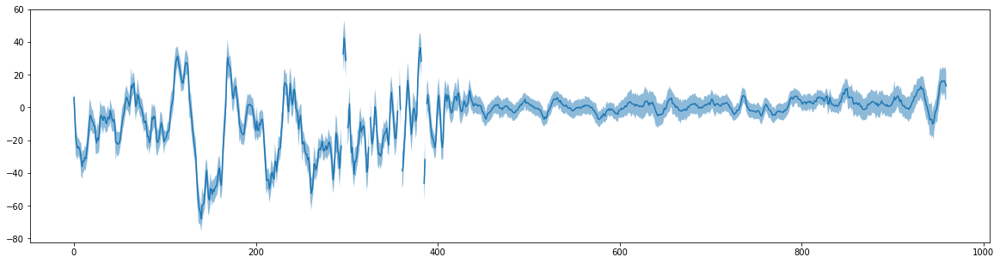

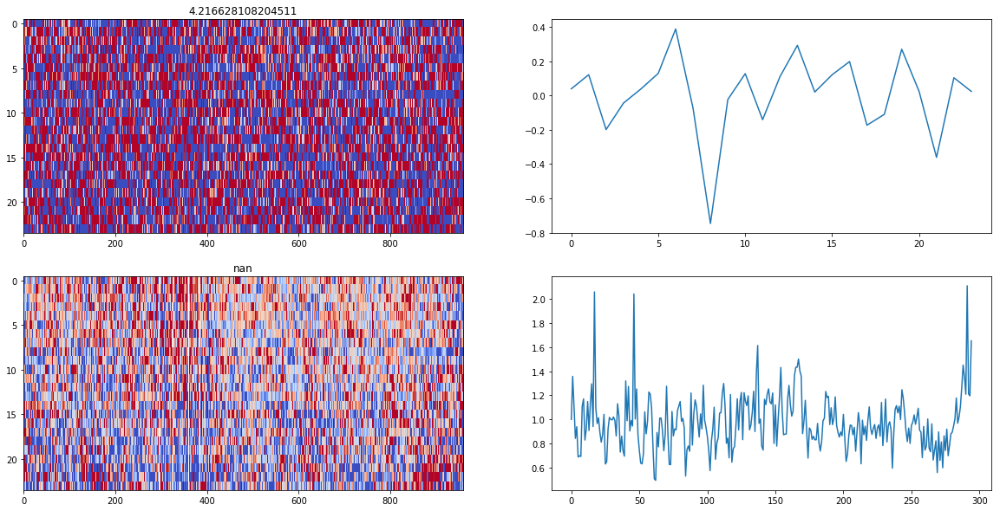

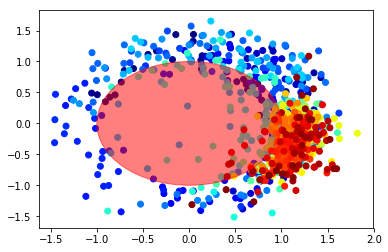

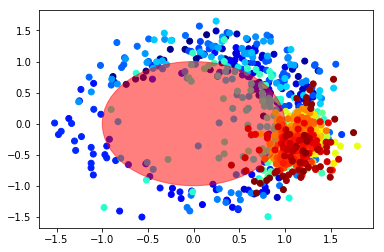

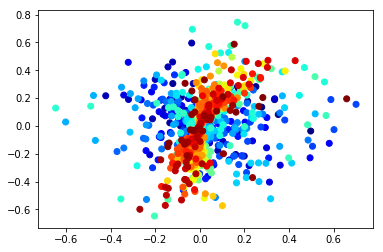

34


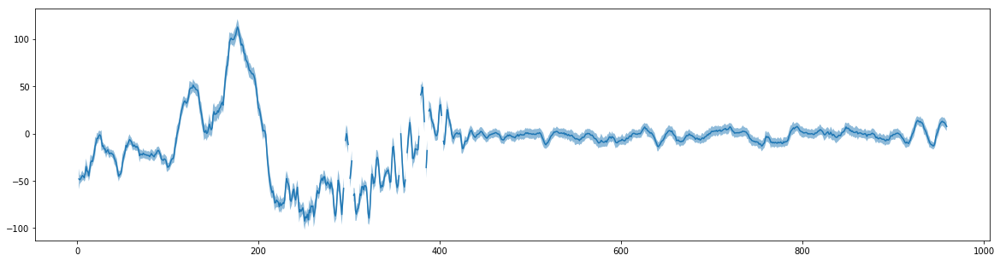

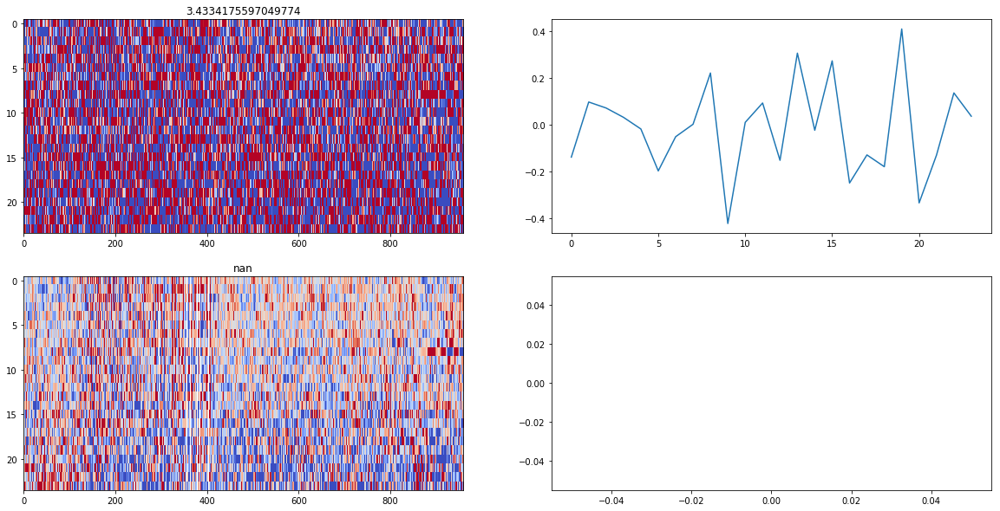

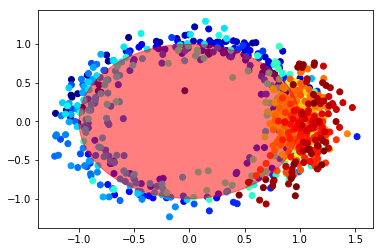

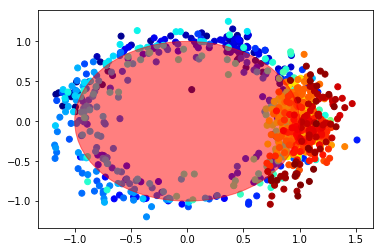

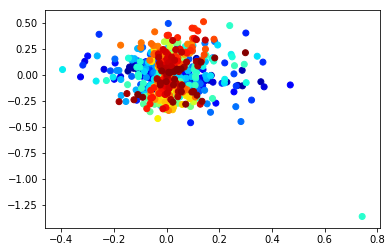

35


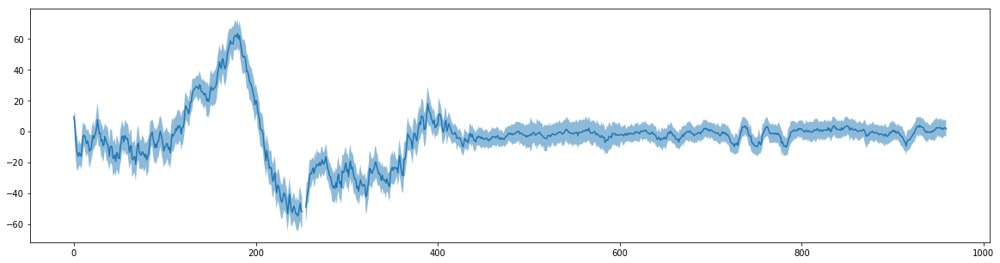

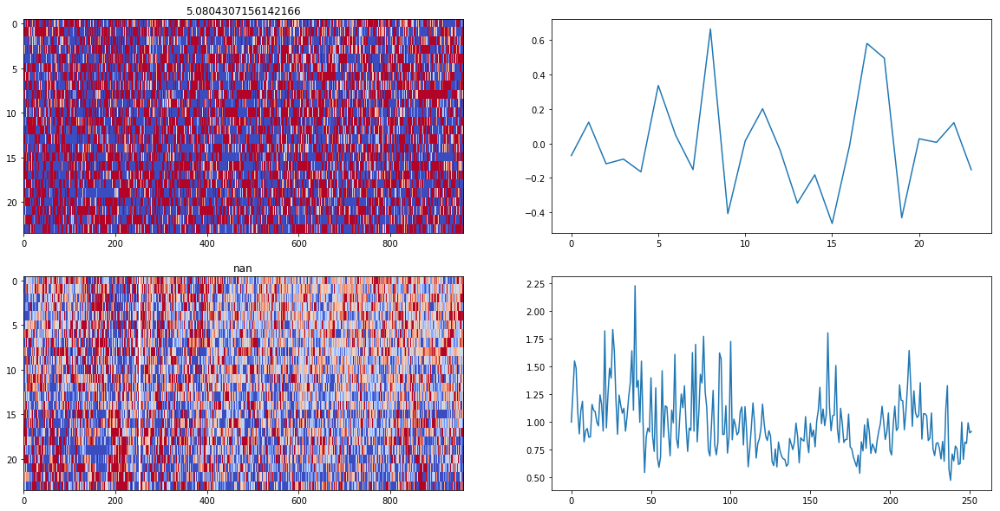

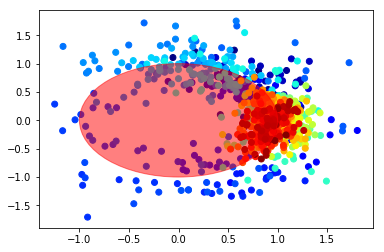

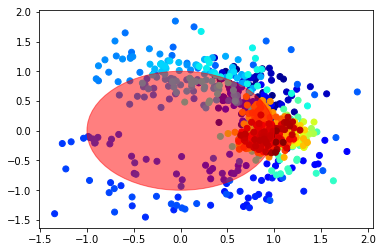

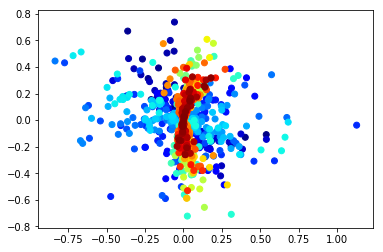

In [259]:
plt.imshow(eff_tec[0,:,0,:,:].mean(0), aspect='auto', cmap='coolwarm', vmin=-1, vmax=1)
plt.colorbar()
plt.show()

plt.imshow(eff_tec[0,:,0,:,:].std(0), aspect='auto', cmap='coolwarm')
plt.colorbar()
plt.show()

for i in range(tec.shape[1]):
    print(i)
    plt.figure(figsize=(20,5))
    plt.plot(tec[0,i,0, :])
    plt.fill_between(np.arange(tec.shape[-1]), tec[0,i,0,:]-tec_uncert[0,i,0,:], tec[0,i,0,:]+tec_uncert[0,i,0,:],alpha=0.5)
    plt.show()
    
    _, axs = plt.subplots(2,2, figsize=(20,10))
    axs[0][0].imshow(eff_tec[0,i,0,:, :],aspect='auto', cmap='coolwarm', vmin=-1., vmax=1.)
    axs[0][0].set_title(np.std(eff_tec[0,i,0,:, :]))
    axs[0][1].plot(eff_tec[0,i,0,:, :].mean(1))
    
    axs[1][0].imshow(eff_tec_corrected[0,i,0,:, :],aspect='auto', cmap='coolwarm', vmin=-5., vmax=5.)
    axs[1][0].set_title(np.std(eff_tec_corrected[0,i,0,:, :]))
    std = eff_tec_corrected[0,i,0,:, :].std(0)
    cumsum = np.cumsum(std, axis=0)/(np.arange(len(std)) +1.)
    axs[1][1].plot(std/cumsum)
#     axs[1][1].plot(cumsum)
    plt.show()
    
    


    c = plt.Normalize(0,960)(np.arange(Yreal_raw.shape[-1]))

    plt.scatter(Yreal_raw[0,i,0,12,:], Yimag_raw[0,i,0,12,:], cmap='jet', c=c)
    circle1 = plt.Circle((0, 0), 1., color='r',alpha=0.5)
    plt.gca().add_artist(circle1)
    plt.show()
    
    plt.scatter(Yreal_post[0,i,0,12,:], Yimag_post[0,i,0,12,:], cmap='jet', c=c)
    circle1 = plt.Circle((0, 0), 1., color='r',alpha=0.5)
    plt.gca().add_artist(circle1)
    plt.show()

    plt.scatter(diff_real[0,i,0,12,:], diff_imag[0,i,0,12,:], cmap='jet', c=c)
    plt.show()

In [216]:
np.where(np.isnan(tec))

(array([0, 0, 0, ..., 0, 0, 0]),
 array([ 0,  0,  0, ..., 34, 34, 34]),
 array([0, 0, 0, ..., 0, 0, 0]),
 array([121, 507, 508, ..., 842, 958, 959]))